# Site selection protocol for the i-trees project

<div>
<img src="../documents/protocol.jpeg" width="1000"/>
</div>

## Section 0: Import modules

In [1]:
import pandas as pd
import momepy
import geopandas as gpd
import matplotlib.pyplot as plt

#import osmnx as ox

import numpy as np
from tqdm.auto import tqdm  # progress bar
import math
import warnings

import geopandas as gpd
import libpysal
import networkx as nx
import numpy as np
from numpy.lib import NumpyVersion
from shapely.geometry import Point, LineString
from shapely.geometry import Polygon

#import os; os.environ['PROJ_LIB'] = '/path/to/env/share/proj'  #- prob not necessary if in own environment, just for gds8 error

pd.set_option('display.max_columns', None) #-- to show all columns. To reset: pd.reset_option(“max_columns”)

/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/momepy/coins.py:15: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [24]:
import geopandas as gpd
import folium

## Section 1: Importing and cleaning tree dataset

__Don't need to do this in the final version, will receive a already filtered dataset__


In [3]:
# Read gpkg and show contents
all_trees = gpd.read_file('../data/raw_data/trees/trees_11112022.gpkg')
all_trees.head()

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,geometry
0,1,00000a59-0b14-4fd4-8e1c-ac924d8cc9b8,Rotterdam,Aesculus hippocastanum,194,Aesculus,hippocastanum,None,25.4,11.1,POINT (87670.050 440949.360)
1,2,00000cdf-33b9-431c-84d8-be5d4cf8df87,Utrecht,Catalpa bignonioides 'Nana',349,Catalpa,bignonioides,Nana,3.0,2.0,POINT (137578.786 458618.712)
2,3,00003c8e-3f16-400d-acdc-a07705c0d22a,Den Haag,Corylus colurna 'VDB Obelisk',477,Corylus,colurna,VDB Obelisk,3.0,2.0,POINT (78722.829 452904.528)
3,4,000042b4-7bee-4999-8513-8d152afd7c43,Groningen,Salix alba,1641,Salix,alba,None,30.9,11.5,POINT (231367.398 583660.647)
4,5,00004913-6b0b-4491-8559-1a9d9443ff77,Rotterdam,Styphnolobium japonicum,1768,Styphnolobium,japonicum,None,13.5,9.8,POINT (90530.430 436378.670)


In [4]:
all_trees.bron.unique()

array(['Rotterdam', 'Utrecht', 'Den Haag', 'Groningen', 'Heerhugowaard',
       'Amsterdam', 'Hendrik-Ido-Ambacht', 'Dordrecht'], dtype=object)

In [3]:
# Show format of the dataframe
all_trees.shape

(975286, 11)

In [4]:
# Show crs of dataframe to confirm whether any transformations are necessary
all_trees.crs

<Derived Projected CRS: EPSG:28992>
Name: Amersfoort / RD New
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Netherlands - onshore, including Waddenzee, Dutch Wadden Islands and 12-mile offshore coastal zone.
- bounds: (3.2, 50.75, 7.22, 53.7)
Coordinate Operation:
- name: RD New
- method: Oblique Stereographic
Datum: Amersfoort
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

### 1.1: Filter only necessary tree species

The tree species in question are the following:
- Platanus x hispanica
- Tilia x europaea
- Ulmus x hollandica

In [4]:
# Create a separate dataframe for each of the species in question and see how many there are 
platanus = all_trees.loc[(all_trees["genus"] == "Platanus") & (all_trees["species"] == "hispanica")]
platanus.shape

(45226, 11)

In [5]:
# Create a separate dataframe for each of the species in question and see how many there are 
tilia = all_trees.loc[(all_trees["genus"] == "Tilia") & (all_trees["species"] == "europaea")]
tilia.shape

(56250, 11)

In [6]:
# Create a separate dataframe for each of the species in question and see how many there are 
ulmus = all_trees.loc[(all_trees["genus"] == "Ulmus") & (all_trees["species"] == "hollandica")]
ulmus.shape

(32215, 11)

In [12]:
ulmus.head()

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,geometry
30,31,000238bf-1d9d-4a3f-af79-2e688368c2cb,Amsterdam,Ulmus ×hollandica 'Vegeta',1942,Ulmus,hollandica,Vegeta,3.0,10.7,POINT (124997.824 490644.550)
40,41,00030a40-d453-4b35-8a67-58fac4f65297,Rotterdam,Ulmus ×hollandica 'Commelin',1935,Ulmus,hollandica,Commelin,3.0,10.9,POINT (96995.540 439974.200)
157,158,000abfcf-cabb-4156-b049-a02a95c24334,Utrecht,Ulmus ×hollandica 'Vegeta',1942,Ulmus,hollandica,Vegeta,24.1,16.4,POINT (135937.322 459382.986)
172,173,000bc6ec-ab8a-4cb8-a845-abce15293270,Amsterdam,Ulmus ×hollandica,1931,Ulmus,hollandica,None,16.9,11.2,POINT (121227.589 487745.236)
252,253,0010f310-3403-412e-85ce-66facdaf13a5,Utrecht,Ulmus ×hollandica 'Commelin',1935,Ulmus,hollandica,Commelin,14.0,6.8,POINT (137879.595 452354.321)


The total number of trees available for selection across all cities is:

In [15]:
# Calculate the combined length of all species dataframes to get to the final figure
len(platanus) + len(tilia) + len(ulmus)

133691

In [7]:
# combining into a single dataframe
species = [platanus, tilia, ulmus]
study_trees = pd.concat(species)
study_trees.shape

(133691, 11)

#### 1.1.1 Number of trees per species per city

First genus species only, then go into cultivar

In [16]:
tree_observations = study_trees["genus"].value_counts()
print(tree_observations)

Tilia       56250
Platanus    45226
Ulmus       32215
Name: genus, dtype: int64


In [17]:
study_trees.dtypes

rowid                   int64
uuid                   object
bron                   object
tree_name              object
tree_intid              int64
genus                  object
species                object
cv                     object
bm_treeheight         float64
bm_crown_diameter     float64
geometry             geometry
dtype: object

In [18]:
# Get a dataframe with the number of observations per genus per city.

obs = study_trees.groupby(["bron", "genus"]).size().reset_index(name="Times")

# They are object type, so change type to string to further work with them

obs['bron'] = obs['bron'].astype("string")
obs['genus'] = obs['genus'].astype("string")

obs

,bron,genus,Times
0,Amsterdam,Platanus,15099
1,Amsterdam,Tilia,14831
2,Amsterdam,Ulmus,13669
3,Den Haag,Platanus,4108
4,Den Haag,Tilia,10033
5,Den Haag,Ulmus,5671
6,Dordrecht,Platanus,2872
7,Dordrecht,Tilia,2174
8,Dordrecht,Ulmus,415
9,Groningen,Platanus,2625


## Section 2: Tree selection protocol

The first task is to split the tree dataset into two:
- Trees in parks
- Trees in street canyons (only E-W direction)

for that we need the national landuse dataset which is available via WFS or download for the whole country

#### 2.0.1 Downloading dataset using WFS
In theory the data can be queried, but the standard with which it is accessed is tricky to play with. I've resorted to simply downloading the dataset from the link. 

__Potential to-do: Include some basic documentation how to query WFS__

In [ ]:
from owslib.wfs import WebFeatureService

In [ ]:
# Put the WFS url in a variable
wfsUrl = 'https://geodata.nationaalgeoregister.nl/nwbwegen/wfs?'

# Create a WFS object
wfs = WebFeatureService(url=wfsUrl, version='2.0.0')

# Get the title from the object
print(wfs.identification.title)

# Check the contents of the WFS
print(list(wfs.contents))

In [ ]:
# Select a example tree to test the wfs query for landuse.
one_tree = all_trees.sample()
one_tree = one_tree.to_crs(3035)
one_tree = one_tree.geometry
one_tree

#### 2.0.2 Downloading the full dataset from PDOK


In [8]:
# import landuse dataset as geodataframe using geopandas, then transform to Ammersfoort (28992)
luseGDF = gpd.read_file('../data/raw_data/landuse/landuse.gml').to_crs(28992)

# Check how many features and attributes were loaded
luseGDF.shape

(171543, 12)

In [20]:
# Check contents of landuse dataset. We're especially interested in the 'description' column
luseGDF.head()

,gml_id,description,name,localId,namespace,beginLifespanVersion,hilucsPresence,specificPresence,observationDate,validFrom,validTo,geometry
0,BBG2017_1,Railroad,4_1_2,BBG2017_1,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"MULTIPOLYGON (((43278.343 374529.047, 43278.34..."
1,BBG2017_2,Railroad,4_1_2,BBG2017_2,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"MULTIPOLYGON (((120111.165 403198.571, 120116...."
2,BBG2017_3,Railroad,4_1_2,BBG2017_3,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"MULTIPOLYGON (((165518.176 403933.251, 165525...."
3,BBG2017_4,Railroad,4_1_2,BBG2017_4,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"MULTIPOLYGON (((99772.811 423051.843, 99772.09..."
4,BBG2017_5,Railroad,4_1_2,BBG2017_5,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"MULTIPOLYGON (((105349.791 429333.509, 105373...."


In [21]:
# Using .unique(), we can get all unique values in the description column and identify the values we're interested in
luseGDF.description.unique()

array(['Railroad', 'Main road', 'Airport', 'Residential',
       'Retail trade, hotel and catering', 'Public institutions',
       'Socio-cultural facility', 'Industrial area and offices',
       'Dumping site', 'Car wreck site', 'Cemetery', 'Mining area',
       'Building site', 'Other semi built-up area',
       'Park and public garden', 'Sports ground (incl. car parks)',
       'Allotment garden', 'Area for daytrips', 'Holiday recreation',
       'Greenhouses', 'Other agricultural usage', 'Woodland',
       'Dry natural area', 'Wet natural area', 'Ijsselmeer of Markermeer',
       'Enclosed estuary', 'Rijn & Maas', 'Randmeer', 'Water reservoir',
       'Water with recreational usage',
       'Water where minerals are extracted',
       'Area for storing industrial water', 'Other inland water',
       'Waddenzee, Eems, Dollard', 'Oosterschelde', 'Westerschelde',
       'Noordzee', 'Foreign countries'], dtype=object)

##### TO BE DELETED AND NOT DIRECTLY RELEVANT: EXPORT LANDUSE JUST FOR NOORD HOLLAND

/opt/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


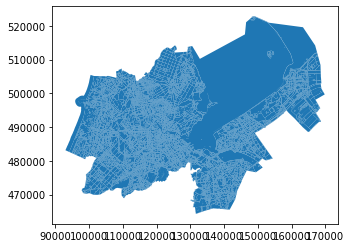

In [5]:
# Load MRA extent

mra_area = gpd.read_file('../data/raw_data/AMS/MRA_lnglat.json').to_crs(28992)

luse_mra = luseGDF.clip(mra_area)

luse_mra.plot()

luse_mra.to_file('../results/output/landuse_mra.gpkg', driver='GPKG')

<AxesSubplot:>

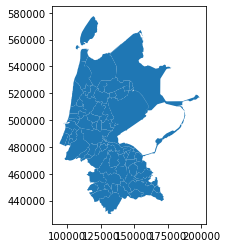

In [166]:
#Load study area extent - both Rdam and AMS
admin_area = gpd.read_file('../data/raw_data/admin_area/gadm41_NLD_2.json').to_crs(28992)

noord_holland = admin_area.loc[(admin_area['NAME_1'] == 'Noord-Holland')  | (admin_area['NAME_1'] == 'Utrecht') | (admin_area['NAME_1'] == 'IJsselmeer')]
noord_holland.plot()
#holland = admin_area.loc[(admin_area['NAME_1']  == 'Zuid-Holland') | (admin_area['NAME_1'] == 'Noord-Holland') | (admin_area['NAME_1'] == 'Utrecht') | (admin_area['NAME_1'] == 'IJsselmeer')].dissolve('COUNTRY')

In [167]:
luseGDF_clip = luseGDF.clip(noord_holland)
luseGDF_clip.to_file('../results/output/landuse_noord_holland.gpkg', driver='GPKG')

/opt/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


### 2.1: Water proximity exclusion

- use landuse dataset. Description: Other inland water, Water with recreational usage, Water reservoir, Wet natural area

__INCLUDE COASTAL WATERS__

Step by step:

- create new dataframe just containing water surfaces
- dissolve
- buffer (__CONFIRM BUFFER SIZE WITH DANIELA__)
- overlay, how='difference' should do the trick and exclude all trees that are located within the buffer polygon boundaries.

In [16]:
# Isolate the water surfaces from the rest of the countrywide landuse dataset, then check how many features are left. 
# The dataframe that was created will be used multiple times so keep it in mind
water = luseGDF.loc[(luseGDF.description == 'Other inland water') | (luseGDF.description == 'Water with recreational usage') | (luseGDF.description == 'Water reservoir') | (luseGDF.description == 'Wet natural area')]
water.shape

(24561, 12)

In [55]:
water.description.unique()

array(['Wet natural area', 'Water reservoir',
       'Water with recreational usage', 'Other inland water'],
      dtype=object)

__CONFIRM WITH DANIELA: BUFFER SIZE FOR WATER__

In [11]:
# Create a copy of the geodataframe to work with
water_buffer = water

# Creating the buffer as separate geometry
water_buffer['buffergeometry'] = water_buffer.buffer(75)

# Drop existing geometry column to make way for the buffergeometry
water_buffer = water_buffer.drop(columns=['geometry'])

# Renaming buffer column
water_buffer.rename(columns={'buffergeometry':'geometry'}, inplace=True)

# Set geometry to the geometry column just in case
water_buffer = water_buffer.set_geometry('geometry')

#water_buffer = water_buffer.dissolve()

# Show resulting dataset to confirm geometry column exists and has values
water_buffer.head()

/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,gml_id,description,name,localId,namespace,beginLifespanVersion,hilucsPresence,specificPresence,observationDate,validFrom,validTo,geometry
146565,BBG2017_146566,Wet natural area,6_3_1,BBG2017_146566,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((176804.050 311306.643, 176803.939 31..."
146566,BBG2017_146567,Wet natural area,6_3_1,BBG2017_146567,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((184043.097 320149.202, 184041.211 32..."
146567,BBG2017_146568,Wet natural area,6_3_1,BBG2017_146568,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((198167.378 321995.460, 198162.540 32..."
146568,BBG2017_146569,Wet natural area,6_3_1,BBG2017_146569,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((194489.967 324284.768, 194488.018 32..."
146569,BBG2017_146570,Wet natural area,6_3_1,BBG2017_146570,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((189932.750 327737.756, 189932.731 32..."


__CHECK, CAN I REPLACE THE ABOVE FUNCTION WITH THIS?__

In [135]:
# Create a copy of the geodataframe to work with
water_buffer = water.copy()

# Creating the buffer as separate geometry
water_buffer['geometry'] = water_buffer.buffer(25)

# Show resulting dataset to confirm geometry column exists and has values
water_buffer.head()

,gml_id,description,name,localId,namespace,beginLifespanVersion,hilucsPresence,specificPresence,observationDate,validFrom,validTo,geometry
146565,BBG2017_146566,Wet natural area,6_3_1,BBG2017_146566,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((176859.377 311277.409, 176857.044 31..."
146566,BBG2017_146567,Wet natural area,6_3_1,BBG2017_146567,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((184092.977 320152.675, 184091.066 32..."
146567,BBG2017_146568,Wet natural area,6_3_1,BBG2017_146568,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((198185.657 322053.974, 198184.555 32..."
146568,BBG2017_146569,Wet natural area,6_3_1,BBG2017_146569,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((194579.511 324392.964, 194580.651 32..."
146569,BBG2017_146570,Wet natural area,6_3_1,BBG2017_146570,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((189964.421 327776.464, 189963.466 32..."


In [137]:
# Create a new dataframe containing only trees that don't overlap the water_buffer dataframe
study_trees_no_water = study_trees.overlay(water_buffer, how='difference')

# Show the result
print(f'The water filter removed {len(study_trees)-len(study_trees_no_water)} trees from the dataset which were less than 25m away from a water surface')

The water filter removed 22617 trees from the dataset which were less than 25m away from a water surface


__SHOW WHAT THIS LOOKS LIKE IN AMSTERDAM__

In [26]:
ams_shape = gpd.read_file('../data/raw_data/admin_area/gadm41_NLD_2.json').to_crs(28992)
ams_shape = ams_shape.loc[(ams_shape['NAME_2']  == 'Amsterdam')]

In [138]:
water_ams = water_buffer.clip(ams_shape)

In [28]:
trees_ams = study_trees.clip(ams_shape)

In [139]:
# Create a new dataframe containing only trees that don't overlap the water_buffer dataframe
ams_water_difference = trees_ams.overlay(water_ams, how='difference')
# Show the result
ams_water_difference.shape

(33545, 11)

In [31]:
# Create a new dataframe containing only trees that don't overlap the water_buffer dataframe in AMSTERDAM
ams_water_difference = trees_ams.overlay(water_ams, how='difference')
# Show the result
ams_water_difference.shape

(24225, 11)

__SHOW DANIELA THE IMPACT OF THE WATER FILTER BY USE OF THIS MAP__

In [ ]:
m = water_ams.explore(column="description", tooltip="description", tiles="CartoDB positron", cmap="Set1"
)

trees_ams.explore(
     m=m, color='red' # use red color on all points
)

ams_water_difference.explore(
    m=m, color='green')

folium.TileLayer('CartoDB positron', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m  # show map

### 2.2: Trees in parks

Trees in parks can filtered by land use data which is available for the entirety of the NL.

The dataset is INSPIRE harmonised and thus should be available in similar format for other EU countries (confirm)

Download link:
https://www.nationaalgeoregister.nl/geonetwork/srv/eng/catalog.search#/metadata/6318009c-7b11-4ab9-9929-735584dfb692?tab=relations

In [9]:
# Isolate the parks and public gardens from the rest of the countrywide landuse dataset, then check how many features are left. 
# We will use the new dataframe that was created at a later stage
parks = luseGDF.loc[luseGDF.description == 'Park and public garden']
parks.shape

(6667, 12)

#### 2.2.3 ADDING THE LANDUSE INFORMATION TO THE TREES INCLUDED IN THE STUDY

FYI, function documented here: https://www.matecdev.com/posts/point-in-polygon.html

In [33]:
# Using a spatial join, we can add the corresponding landuse class (landuse.description) to each of the trees

treeslanduse = gpd.tools.sjoin(study_trees_no_water, luseGDF, predicate="within", how="left")
treeslanduse.head()

# Can then as next step filter the data down to only include the trees in park and public garden. But this way we are creating a dataframe that we could use for a variety of queries and further filtering

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,geometry,index_right,gml_id,description,name,localId,namespace,beginLifespanVersion,hilucsPresence,specificPresence,observationDate,validFrom,validTo
0,51,00038cf6-d99a-4d13-8702-76a6a047de62,Groningen,Platanus ×hispanica,1181,Platanus,hispanica,None,20.1,10.7,POINT (229687.409 580299.600),20270,BBG2017_20271,Residential,5,BBG2017_20271,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
1,80,0005c248-f6f7-40aa-972b-4ce74bcfdad6,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,21.2,14.3,POINT (92083.890 438938.080),888,BBG2017_889,Main road,4_1_1,BBG2017_889,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
2,143,000a17db-c6ac-4ad5-b35e-597b61f1f896,Utrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,4.7,4.7,POINT (134117.840 453505.637),48373,BBG2017_48374,Building site,6_1,BBG2017_48374,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
3,156,000a928a-3b23-4e58-8012-b2dd6ed8c97b,Hendrik-Ido-Ambacht,Platanus ×hispanica,1181,Platanus,hispanica,None,3.0,11.2,POINT (103924.914 427853.067),7296,BBG2017_7297,Residential,5,BBG2017_7297,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
4,163,000b238e-d4c7-4263-b092-ffbe2541620c,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,13.5,14.5,POINT (91426.590 437374.960),888,BBG2017_889,Main road,4_1_1,BBG2017_889,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15


In [35]:
# Create a new dataframe including only the trees that are located in the land use category we want
treesinparks = treeslanduse.loc[treeslanduse.description == 'Park and public garden']
# Check how many trees are located within the Park and public garden category
treesinparks.shape

(12296, 23)

__SHOW THE SELECTION AT WORK INTERACTIVELY BELOW__

In [ ]:
treesinparks.explore()

###### __Just because we can: Trees in what landuse per city__

In [37]:
# Get a dataframe with the number of observations per landuse class per city.
obs = treeslanduse.groupby(["bron", "description"]).size().reset_index(name="Times")

# They are object type, so change type to string to further work with them

obs['bron'] = obs['bron'].astype("string")
obs['description'] = obs['description'].astype("string")

obs

,bron,description,Times
0,Amsterdam,Allotment garden,153
1,Amsterdam,Area for daytrips,58
2,Amsterdam,Building site,132
3,Amsterdam,Cemetery,122
4,Amsterdam,Holiday recreation,68
...,...,...,...
115,Utrecht,Residential,5758
116,Utrecht,"Retail trade, hotel and catering",814
117,Utrecht,Socio-cultural facility,736
118,Utrecht,Sports ground (incl. car parks),492


#### 2.2.4: Only select trees that are at least x m away from the polygon boundary.

This is done with the following steps:
- create a buffer around each tree
- use the overlay function to get the intersections between trees and park polygons.
- look at the buffer polygon areas after intersection. If they are untouched, the trees are located at least the buffer distance away from the park boundaries.

Sources/materials:
- https://geopandas.org/en/stable/docs/user_guide/set_operations.html

__CONFIRM WITH DANIELA: 300m radius / diameter is too big. Then we're left with almost no trees. 75m radius leaves us with 430 trees in the dataset. 50m radius with 969. This is with perfect circles. Maybe we can give some tolerance?__ 

In [ ]:
### OLD VERSION, TBC IF I CAN REPLACE WITH BELOW
# Create a copy of the geodataframe to work with
tree_buffer = treesinparks.copy()

#Creating the buffers
tree_buffer['buffergeometry'] = tree_buffer.buffer(75)

tree_buffer = tree_buffer.drop(columns=['geometry'])

# Renaming buffer column
tree_buffer.rename(columns={'buffergeometry':'geometry'}, inplace=True)

# Set geometry to the geometry column just in case
tree_buffer = tree_buffer.set_geometry('geometry')

# Show resulting dataset to confirm calculation (and switch from point to polygon geometry)
tree_buffer.head()

__USE THIS TO CREATE NEW DATASET WITH DIFFERENT BUFFER__

In [45]:
# Create a copy of the geodataframe to work with
tree_buffer = treesinparks.copy()

#Creating the buffers
tree_buffer['geometry'] = tree_buffer.buffer(50)

# Show resulting dataset to confirm calculation (and switch from point to polygon geometry)
tree_buffer.head()

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,geometry,index_right,gml_id,description,name,localId,namespace,beginLifespanVersion,hilucsPresence,specificPresence,observationDate,validFrom,validTo
26,897,0038f06e-6553-4560-a249-31f77d5fa9c4,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,18.0,14.1,"POLYGON ((83881.910 430811.880, 83881.669 4308...",53473,BBG2017_53474,Park and public garden,3_4_4,BBG2017_53474,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
28,976,003e0b8d-3d7b-41b2-a1b6-d5cc64b6dc60,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,13.6,13.0,"POLYGON ((83766.930 431388.550, 83766.689 4313...",53537,BBG2017_53538,Park and public garden,3_4_4,BBG2017_53538,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
32,1128,00467c01-0cf1-4db3-85f6-fa2f78bca9be,Utrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,25.1,9.6,"POLYGON ((135666.011 453621.202, 135665.770 45...",54740,BBG2017_54741,Park and public garden,3_4_4,BBG2017_54741,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
53,1816,0075e198-c4ec-4b1b-802b-0f1798d2b7e3,Dordrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,22.9,28.8,"POLYGON ((106166.246 424779.423, 106166.005 42...",53147,BBG2017_53148,Park and public garden,3_4_4,BBG2017_53148,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
61,2052,0085c000-d454-4cc3-836d-56d43067de30,Amsterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,23.4,12.2,"POLYGON ((115556.054 487948.599, 115555.813 48...",56284,BBG2017_56285,Park and public garden,3_4_4,BBG2017_56285,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15


In [46]:
# Use the overlay function to calculate the intersection between tree_buffer and park polygons. 
park_intersect = tree_buffer.overlay(parks, how='intersection')

# Calculate the area (in m2) that is left of each individual tree buffer after the intersection
park_intersect['buffer_area'] = park_intersect.geometry.area

# Show the resulting geodataframe
park_intersect.head()

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,index_right,gml_id_1,description_1,name_1,localId_1,namespace_1,beginLifespanVersion_1,hilucsPresence_1,specificPresence_1,observationDate_1,validFrom_1,validTo_1,gml_id_2,description_2,name_2,localId_2,namespace_2,beginLifespanVersion_2,hilucsPresence_2,specificPresence_2,observationDate_2,validFrom_2,validTo_2,geometry,buffer_area
0,897,0038f06e-6553-4560-a249-31f77d5fa9c4,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,18.0,14.1,53473,BBG2017_53474,Park and public garden,3_4_4,BBG2017_53474,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,BBG2017_53454,Park and public garden,3_4_4,BBG2017_53454,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((83827.009 430762.121, 83822.155 4307...",1419.604893
1,35689,09619c13-5c4f-4d8e-86f8-5e25e43099cd,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,14.0,14.8,53453,BBG2017_53454,Park and public garden,3_4_4,BBG2017_53454,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,BBG2017_53454,Park and public garden,3_4_4,BBG2017_53454,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((83890.836 430703.740, 83888.313 4306...",5142.970837
2,49246,0ceb4f4d-e0b5-4a65-ba5f-81d8d8c9c17e,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,14.0,16.2,53453,BBG2017_53454,Park and public garden,3_4_4,BBG2017_53454,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,BBG2017_53454,Park and public garden,3_4_4,BBG2017_53454,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((83785.040 430854.404, 83780.604 4308...",1750.302680
3,67900,11d5cf12-b025-4bf2-9d6a-312cd5f09e5f,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,20.9,13.1,53473,BBG2017_53474,Park and public garden,3_4_4,BBG2017_53474,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,BBG2017_53454,Park and public garden,3_4_4,BBG2017_53454,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((83786.956 430844.793, 83782.336 4308...",998.316939
4,177356,2e8fc5ab-a0bf-42de-be97-e2d18c4513f0,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,16.2,17.0,53473,BBG2017_53474,Park and public garden,3_4_4,BBG2017_53474,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,BBG2017_53454,Park and public garden,3_4_4,BBG2017_53454,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((83812.435 430783.411, 83807.676 4307...",1420.382960


<AxesSubplot: >

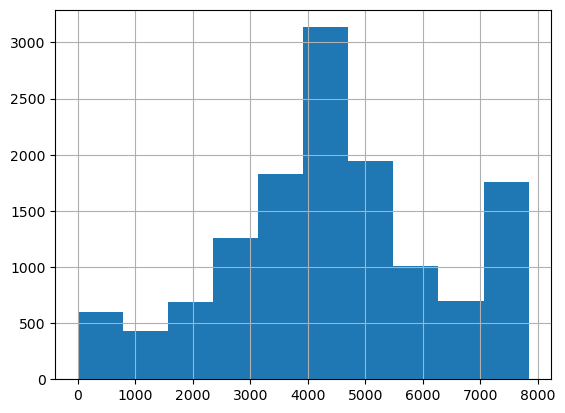

In [47]:
# Create a histogram of the tree buffer after intersection. 
# You can clearly see that a majority of trees is too close to the boundaries to remain with their entire buffer area intact (17643 m2)
park_intersect.buffer_area.hist()

https://www.calculateme.com/shape-area/circle/150-meters

In [41]:
# See which of the trees is at least 75m away from the park boundaries (and thus other land use)
# Calculated with the area from https://www.calculateme.com/shape-area/circle/150-meters
tree_selection = park_intersect.loc[park_intersect.buffer_area >= 17643]
# Show the amount of trees left
tree_selection.shape

(427, 35)

In [55]:
# See which of the trees is at least 50 away from the park boundaries (and thus other land use)
# Calculated with the area from https://www.calculateme.com/shape-area/circle/150-meters
tree_selection = park_intersect.loc[park_intersect.buffer_area >= 7840]
# Show the amount of trees left
tree_selection.shape

(969, 35)

In [43]:
# Clip park landuse dataset with AMS shape to be able to display it properly.
ams_parks = parks.clip(ams_shape)

__SHOW DANIELA: 75m RADIUS ONLY RESULTS IN ONLY 427 TREES IN THE ENTIRE DATASET. 50m IN 969_

In [ ]:
m = ams_parks.explore(column="description", tooltip="description", tiles="CartoDB positron", cmap="Set1"
)

trees_ams.explore(
     m=m, color='red' # use red color on all points
)

tree_selection.explore(
    m=m, color='green')

folium.TileLayer('CartoDB positron', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control
m.save("../results/output/ams_parks_trees.html")


m  # show map

In [145]:
from folium.plugins import MarkerCluster

In [151]:
import pyproj

In [155]:
from pyproj import CRS

In [171]:
from functools import partial

In [ ]:
import folium
import numpy as np

# Create a folium map object
m = folium.Map(location=[52.37, 4.90], zoom_start=12)

# Create a numpy array representing a raster layer
raster = np.random.randint(0, 255, size=(100, 100, 3))

# Add the raster layer to the folium map
folium.raster_layers.ImageOverlay(raster, bounds=[[52, 4], [53, 5]], opacity=0.5).add_to(m)

# Show the map
m

In [ ]:
# Create a folium map object
m = folium.Map(location=[52.37, 4.90], zoom_start=12)

# Create a MarkerCluster object
marker_cluster = MarkerCluster(name="Tree locations", control=False, prefer_canvas=True, disableClusteringAtZoom=18).add_to(m)

# Set up the projections for the coordinate transformation
inProj = CRS.from_wkt('PROJCS["Amersfoort / RD New",GEOGCS["Amersfoort",DATUM["Amersfoort",SPHEROID["Bessel 1841",6377397.155,299.1528128,AUTHORITY["EPSG","7004"]],AUTHORITY["EPSG","6289"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4289"]],PROJECTION["Oblique_Stereographic"],PARAMETER["latitude_of_origin",52.15616055555555],PARAMETER["central_meridian",5.38763888888889],PARAMETER["scale_factor",0.9999079],PARAMETER["false_easting",155000],PARAMETER["false_northing",463000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["X",EAST],AXIS["Y",NORTH],AUTHORITY["EPSG","28992"]]')
outProj = pyproj.Proj(proj='longlat', datum='WGS84')

transformer = pyproj.Transformer.from_proj(inProj, outProj)

# Add markers to the MarkerCluster object
for idx, row in trees_ams.iterrows():
    x, y = row['geometry'].x, row['geometry'].y
    lon, lat = transformer.transform(x, y)
    folium.Marker(
        location=[lat, lon],
        icon=folium.Icon(icon='leaf', icon_color='green'),
        popup=row['tree_name'] + " - " + "Height: " + str(row['bm_treeheight']) + " - " + "Diameter: " + str(row['bm_crown_diameter']),
    ).add_to(marker_cluster)
    
ams_parks.explore(m=m)
    
folium.TileLayer(tiles='CartoDB positron').add_to(m)
folium.LayerControl().add_to(m)
m.save("../results/output/trees_ams.html")
# Show the map
m

In [58]:
# Clip tree dataset to AMS boundary
ams_trees_buffer = tree_buffer.clip(ams_shape)

# Show the amount of trees left
ams_trees_buffer.shape

(2971, 23)

In [59]:
# Perform the same overlay function, but just with AMS data
ams_park_intersect = ams_trees_buffer.overlay(ams_parks, how='intersection')
# Show the result
# ams_park_intersect.plot(figsize=(25,25),edgecolor='k')

In [ ]:
# Display the results in Amsterdam
ams_park_intersect.explore()

<AxesSubplot:>

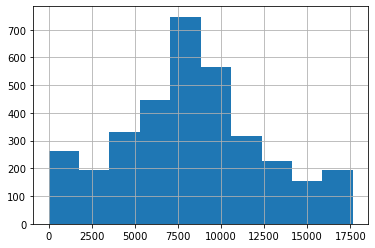

In [121]:
# Calculate the area (in m2) that is left of each individual tree buffer after the intersection
ams_park_intersect['buffer_area'] = ams_park_intersect.geometry.area

# Show a histogram of the dataframe
ams_park_intersect.buffer_area.hist()

In [122]:
# See which of the trees is at least 75m away from the park boundaries (and thus other land use)
# calculated with the area from https://www.calculateme.com/shape-area/circle/150-meters
tree_buffer_free = ams_park_intersect.loc[ams_park_intersect.buffer_area >= 17643]

# Show the amount of trees that are left
tree_buffer_free.shape

(71, 35)

#### 2.2.5: Crown surface, % coverage

- take trees from initial selection
- calculate tree crown area in buffer (__CONFIRM WITH DANIELA:__ WHAT BUFFERSIZE?)
- calculate % cover from the tree crown area

- Leave for now, but keep in mind: crowns will overlap, dissolve crown area in selection to avoid duplicating overlap if needed.

need to first filter back the trees that I selected, because they are polygon instead of point

In [62]:
# Filter original tree dataframe by rowid of the tree buffer dataframe
# From: https://www.includehelp.com/python/how-to-filter-rows-from-a-dataframe-based-on-another-dataframe.aspx
# Can reverse by putting a ~ begind the [

treesinparks_w_buffer = treesinparks[(treesinparks.rowid.isin(tree_selection.rowid))]
treesinparks_w_buffer = treesinparks_w_buffer.drop(columns=['index_right', 'localId', 'namespace', 'beginLifespanVersion', 'hilucsPresence', 'specificPresence', 'observationDate', 'validFrom', 'validTo', 'gml_id', 'name'])
treesinparks_w_buffer

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,geometry,description
32,1128,00467c01-0cf1-4db3-85f6-fa2f78bca9be,Utrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,25.1,9.6,POINT (135616.011 453621.202),Park and public garden
372,11064,02e0b4a1-7455-4a05-b1dc-83e6a9b5d7cd,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,17.1,18.3,POINT (94074.410 435022.680),Park and public garden
778,23889,0640c30a-885b-4f92-bf4a-6b2878a9cfdf,Amsterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,10.1,8.1,POINT (121282.033 482550.100),Park and public garden
1019,30552,07fff0d7-693d-488c-90d9-26bbdef41846,Groningen,Platanus ×hispanica,1181,Platanus,hispanica,None,3.0,2.0,POINT (229755.965 583279.945),Park and public garden
1123,33293,08bf5a6f-da0c-404d-af3f-4580cbe358ea,Utrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,13.3,10.7,POINT (135610.102 459350.944),Park and public garden
...,...,...,...,...,...,...,...,...,...,...,...,...
89938,961344,fc58be40-519b-4d62-8835-a7f605cc7383,Den Haag,Ulmus ×hollandica,1931,Ulmus,hollandica,None,3.0,8.0,POINT (79433.570 456251.085),Park and public garden
89950,961717,fc71baa0-952d-417c-a7b0-ab0966bb24fc,Groningen,Ulmus ×hollandica 'Groeneveld',1938,Ulmus,hollandica,Groeneveld,3.0,19.9,POINT (233019.166 582741.020),Park and public garden
90041,966878,fdd13773-2af4-490f-b5ea-6b9d3b39aefc,Amsterdam,Ulmus ×hollandica 'Commelin',1935,Ulmus,hollandica,Commelin,21.8,18.0,POINT (123407.929 489364.434),Park and public garden
90069,968522,fe42ca9e-cf97-4698-a990-8d95971109bd,Amsterdam,Ulmus ×hollandica,1931,Ulmus,hollandica,None,3.0,10.4,POINT (123152.641 489783.553),Park and public garden


__source_gdf is the selection dataset, tree_gdf is the entire dataset, buffersize tbd with Daniela. This might still have to be adapted to minus the tree crown of the source tree.__

In [63]:
def calculatetreecrownareainvariablebuffer(source_gdf, tree_gdf, buffersize):
    """
    Using the 3DBM gdf, the amsterdam tree dataset and a buffer size in meters as input, calculates the tree crown area in the buffer.
    
    Creates a buffer, then conducts spatial intersection using spatial index for candidates GeoDataFrame to make queries faster.
    
    Clips candidate geometries with buffer area, then computes additional variables in clip area
    
    Finally merges newly computed variables to the source_gdf for return.
    """
    # Creating the basic variables
    source_sindex = source_gdf.sindex
    possible_matches_index = []
    result = {}
    
    #Creating the buffers
    source_gdf['buffergeometry'] = source_gdf.buffer(buffersize)
    
    # Creating a copy with three fields
    intersecting_gdf = source_gdf.loc[:,('rowid','buffergeometry')]

    # Renaming buffer column
    intersecting_gdf.rename(columns={'buffergeometry':'geometry'}, inplace=True)

    # Set geometry to the geometry column just in case
    intersecting_gdf = intersecting_gdf.set_geometry('geometry')
    
    # Create buffer from radius value in tree dataset
    tree_gdf['buffer'] = tree_gdf.buffer((tree_gdf['bm_crown_diameter']/2))
    tree_buffers = tree_gdf.loc[:,('uuid','buffer')]
    tree_buffers.rename(columns={'buffer':'geometry'}, inplace=True)
    tree_sindex = tree_buffers.sindex
        

    # Plot to check if it worked - just for testing
    #intersecting_gdf.boundary.plot()
    
        # 'itertuples()' function is a faster version of 'iterrows()'
    for other in intersecting_gdf.itertuples():
        treeid = other.rowid
        bounds = other.geometry.bounds
        boundaries = other.geometry
        tree_area_list = []

        # Get unique candidates
        unique_candidate_matches = list(tree_sindex.intersection(bounds))
        possible_matches = tree_buffers.iloc[unique_candidate_matches]

        # Conduct the actual intersect
        matches = possible_matches.loc[possible_matches.intersects(other.geometry)]
        
        
        #matches = possible_matches.loc[possible_matches.intersects(intersecting_gdf.unary_union)]
        
        # Using the results of the intersect, clip the possible matches with the current iteration of boundaries from intersecting gdf. 
            
        clip = matches.clip(boundaries)
        #clip.plot()
        
        tree_area_list = clip.geometry.area
        
        tree_crown_area = sum(tree_area_list)
        
        # print(f'The area of the tree crowns is {tree_crown_area}')
        
        result[treeid] = tree_crown_area
        
    tree_crown_area_df = pd.DataFrame.from_dict(result, orient = 'index', columns=[f'tree_crown_area_{buffersize}m'])
    
    merged_df = pd.merge(source_gdf, tree_crown_area_df, left_on='rowid', right_index=True)
    
    merged_df = merged_df.drop(columns=['buffergeometry'])
    
    return merged_df
                                                                                   
        

In [65]:
crown_area_study_trees = calculatetreecrownareainvariablebuffer(source_gdf=treesinparks_w_buffer,tree_gdf=study_trees_no_water,buffersize=25)
crown_area_study_trees

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,geometry,description,tree_crown_area_25m
32,1128,00467c01-0cf1-4db3-85f6-fa2f78bca9be,Utrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,25.1,9.6,POINT (135616.011 453621.202),Park and public garden,1591.579616
372,11064,02e0b4a1-7455-4a05-b1dc-83e6a9b5d7cd,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,17.1,18.3,POINT (94074.410 435022.680),Park and public garden,599.977833
778,23889,0640c30a-885b-4f92-bf4a-6b2878a9cfdf,Amsterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,10.1,8.1,POINT (121282.033 482550.100),Park and public garden,558.101756
1019,30552,07fff0d7-693d-488c-90d9-26bbdef41846,Groningen,Platanus ×hispanica,1181,Platanus,hispanica,None,3.0,2.0,POINT (229755.965 583279.945),Park and public garden,46.072345
1123,33293,08bf5a6f-da0c-404d-af3f-4580cbe358ea,Utrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,13.3,10.7,POINT (135610.102 459350.944),Park and public garden,125.675144
...,...,...,...,...,...,...,...,...,...,...,...,...,...
89938,961344,fc58be40-519b-4d62-8835-a7f605cc7383,Den Haag,Ulmus ×hollandica,1931,Ulmus,hollandica,None,3.0,8.0,POINT (79433.570 456251.085),Park and public garden,232.692692
89950,961717,fc71baa0-952d-417c-a7b0-ab0966bb24fc,Groningen,Ulmus ×hollandica 'Groeneveld',1938,Ulmus,hollandica,Groeneveld,3.0,19.9,POINT (233019.166 582741.020),Park and public garden,422.694361
90041,966878,fdd13773-2af4-490f-b5ea-6b9d3b39aefc,Amsterdam,Ulmus ×hollandica 'Commelin',1935,Ulmus,hollandica,Commelin,21.8,18.0,POINT (123407.929 489364.434),Park and public garden,254.060428
90069,968522,fe42ca9e-cf97-4698-a990-8d95971109bd,Amsterdam,Ulmus ×hollandica,1931,Ulmus,hollandica,None,3.0,10.4,POINT (123152.641 489783.553),Park and public garden,84.812271


<AxesSubplot: >

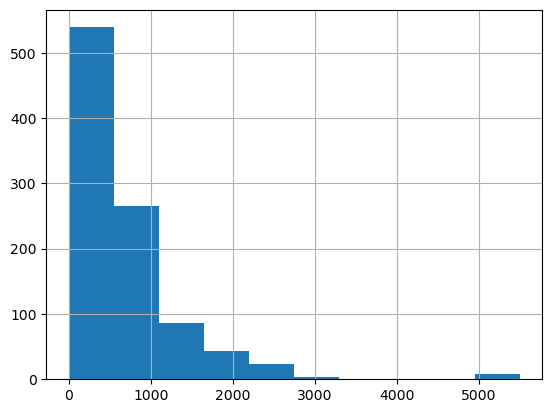

In [66]:
# Let's have a look at the tree crown area distribution
crown_area_study_trees.tree_crown_area_25m.hist()

<AxesSubplot: >

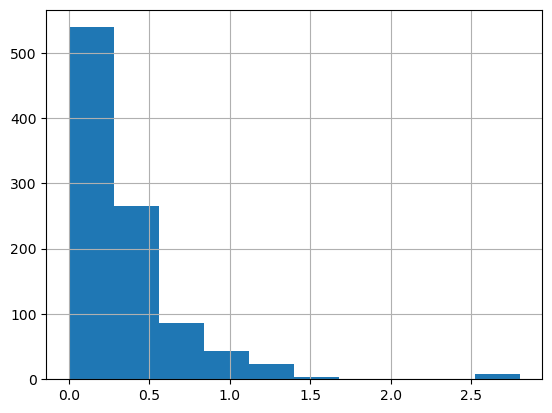

In [67]:
# A full 25m circle has got an area of 1962m2, in order to calculate the % tree crown cover we can perform a simple calculation
ams['perc_tree_cover_25m'] = ams['tree_crown_area_25m']/1962.5
ams.perc_tree_cover_25m.hist()

__TREE COVER % IS FOR CLASSIFICATION__

SHOW WHAT IT LOOKS LIKE INTERACTIVELY_ AFTER CALCULATING TREE CROWN AREA

In [ ]:
m = ams_parks.explore(column="description", tooltip="description", tiles="CartoDB positron", cmap="Set1"
)

trees_ams.explore(
     m=m, color='red' # use red color on all points
)

crown_area_study_trees.explore(
    m=m, color='green')

folium.TileLayer('CartoDB positron', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m  # show map

### Section 2.3: Trees in street canyons

Identify trees in street canyons:
- __CONFIRM WITH DANIELA__ is the inverse of the park selection enough for the first selection? YES IT IS

Overall process:
- get street dataset for all NL
- calculate and filter by orientation (E-W only)
- select trees within buffer of roads (What buffersize do I take?)
- Calculate 

Q: __Can I use the tree dataset to limit the streets I query? Use a buffer to identify roads in vicinity of trees only__

to try out: 
- select single tree known to be in street
- download openstreetmap in buffer with momepy
- clip 3dbm buildings on streets

#### 2.3.1 Initial selection of trees
- inverse of park selection for starters

In [70]:
# Create a new dataframe including only the trees that are located in the land use category we want
trees_other = treeslanduse.loc[~(treeslanduse.description == 'Park and public garden')]
# Check how many trees are located within the Park and public garden category
trees_other.shape

(77880, 23)

#### 2.3.2 Get Study Area boundaries:

For individual city queries. Will have to break down into the different cities.

Got to confirm if all of the study areas are level 2 admin bounds, some might be level 3.

In [71]:
#Load study area extent - both Rdam and AMS
admin_area = gpd.read_file('../data/raw_data/admin_area/gadm41_NLD_2.json').to_crs(28992)
#holland = admin_area.loc[(admin_area['NAME_1']  == 'Zuid-Holland') | (admin_area['NAME_1'] == 'Noord-Holland') | (admin_area['NAME_1'] == 'Utrecht') | (admin_area['NAME_1'] == 'IJsselmeer')].dissolve('COUNTRY')

In [72]:
admin_area

,GID_2,GID_0,COUNTRY,GID_1,NAME_1,NL_NAME_1,NAME_2,VARNAME_2,NL_NAME_2,TYPE_2,ENGTYPE_2,CC_2,HASC_2,geometry
0,NLD.1.1_1,NLD,Netherlands,NLD.1_1,Drenthe,NA,AaenHunze,NA,NA,Gemeente,Municipality,NA,NL.DR.AH,"MULTIPOLYGON (((234495.023 551702.305, 235801...."
1,NLD.1.2_1,NLD,Netherlands,NLD.1_1,Drenthe,NA,Assen,NA,NA,Gemeente,Municipality,NA,NL.DR.AS,"MULTIPOLYGON (((239107.096 560595.343, 239004...."
2,NLD.1.3_1,NLD,Netherlands,NLD.1_1,Drenthe,NA,Borger-Odoorn,NA,NA,Gemeente,Municipality,NA,NL.DR.BO,"MULTIPOLYGON (((246451.501 544422.207, 245743...."
3,NLD.1.4_1,NLD,Netherlands,NLD.1_1,Drenthe,NA,Coevorden,NA,NA,Gemeente,Municipality,NA,NL.DR.CO,"MULTIPOLYGON (((255443.223 519422.409, 254969...."
4,NLD.1.5_1,NLD,Netherlands,NLD.1_1,Drenthe,NA,DeWolden,NA,NA,Gemeente,Municipality,NA,NL.DR.DW,"MULTIPOLYGON (((214933.132 520438.735, 215142...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,NLD.14.89_1,NLD,Netherlands,NLD.14_1,Zuid-Holland,NA,Zoetermeer,NA,NA,Gemeente,Municipality,NA,NL.ZH.ZR,"MULTIPOLYGON (((88904.526 451881.687, 88406.19..."
351,NLD.14.90_1,NLD,Netherlands,NLD.14_1,Zuid-Holland,NA,Zoeterwoude,NA,NA,Gemeente,Municipality,NA,NL.ZH.ZD,"MULTIPOLYGON (((97829.907 461473.887, 97529.75..."
352,NLD.14.104_1,NLD,Netherlands,NLD.14_1,Zuid-Holland,NA,Zuidplas,NA,NA,Gemeente,Municipality,NA,NA,"MULTIPOLYGON (((98742.870 452595.358, 101658.4..."
353,NLD.14.91_1,NLD,Netherlands,NLD.14_1,Zuid-Holland,NA,Zwijndrecht,NA,NA,Gemeente,Municipality,NA,NL.ZH.ZW,"MULTIPOLYGON (((97663.745 427227.815, 98163.35..."


Den Haag is 's-Gravenhage' in the NL admin area dataset. Den Haag is the modern abbreviation?

In [73]:
places_list = ['Rotterdam', 'Utrecht', '\'s-Gravenhage', 'Groningen', 'Heerhugowaard',
       'Amsterdam', 'Hendrik-Ido-Ambacht', 'Dordrecht']

In [14]:
print(admin_area[admin_area['NAME_2'].isin(places_list)])

           GID_2 GID_0      COUNTRY     GID_1         NAME_1 NL_NAME_1  \
88     NLD.5.7_2   NLD  Netherlands   NLD.5_1      Groningen        NA   
193    NLD.9.4_1   NLD  Netherlands   NLD.9_1  Noord-Holland        NA   
210   NLD.9.27_1   NLD  Netherlands   NLD.9_1  Noord-Holland        NA   
280  NLD.11.27_1   NLD  Netherlands  NLD.11_1        Utrecht        NA   
302   NLD.14.2_1   NLD  Netherlands  NLD.14_1   Zuid-Holland        NA   
311  NLD.14.23_1   NLD  Netherlands  NLD.14_1   Zuid-Holland        NA   
317  NLD.14.31_1   NLD  Netherlands  NLD.14_1   Zuid-Holland        NA   
340  NLD.14.67_2   NLD  Netherlands  NLD.14_1   Zuid-Holland        NA   

                  NAME_2 VARNAME_2 NL_NAME_2    TYPE_2     ENGTYPE_2 CC_2  \
88             Groningen        NA        NA  Gemeente  Municipality   NA   
193            Amsterdam        NA        NA  Gemeente  Municipality   NA   
210        Heerhugowaard        NA        NA  Gemeente  Municipality   NA   
280              Utrecht 

<AxesSubplot: >

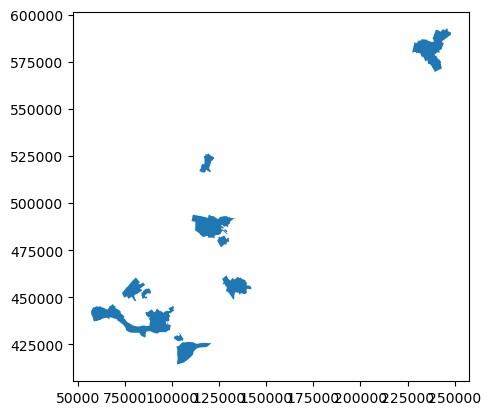

In [74]:
study_areas = admin_area[admin_area['NAME_2'].isin(places_list)]
study_areas.plot()

#### 2.3.3 Street orientation

In [75]:
# read road network of NL, this should be the one to use
network = gpd.read_file('../data/raw_data/rijkswaterstraat/01-12-2022/Wegvakken/Wegvakken.shp')

In [19]:
# Clipped to the study areas
network_study_areas = network.clip(study_areas)
# Then saved to file
network_study_areas.to_file('../data/clean_data/wegvakken.gpkg', layer='original', driver='GPKG')

In [76]:
# USE THIS, ALREADY CLIPPED AND READY TO USE. JUST NEED TO SIMPLIFY?
network = gpd.read_file('../data/clean_data/wegvakken.gpkg', layer='original')

In [24]:
network

,WVK_ID,WVK_BEGDAT,JTE_ID_BEG,JTE_ID_END,WEGBEHSRT,WEGNUMMER,WEGDEELLTR,HECTO_LTTR,BST_CODE,RPE_CODE,ADMRICHTNG,RIJRICHTNG,STT_NAAM,STT_BRON,WPSNAAM,GME_ID,GME_NAAM,HNRSTRLNKS,HNRSTRRHTS,E_HNR_LNKS,E_HNR_RHTS,L_HNR_LNKS,L_HNR_RHTS,BEGAFSTAND,ENDAFSTAND,BEGINKM,EINDKM,POS_TV_WOL,WEGBEHCODE,WEGBEHNAAM,DISTRCODE,DISTRNAAM,DIENSTCODE,DIENSTNAAM,WEGTYPE,WGTYPE_OMS,ROUTELTR,ROUTENR,ROUTELTR2,ROUTENR2,ROUTELTR3,ROUTENR3,ROUTELTR4,ROUTENR4,WEGNR_AW,WEGNR_HMP,GEOBRON_ID,GEOBRON_NM,BRONJAAR,OPENLR,BAG_ORL,FRC,FOW,ALT_NAAM,ALT_NR,REL_HOOGTE,geometry
0,600189084,2020-12-01,600022948,481540006,G,None,#,#,None,#,None,B,Schutsweg,BAG schrijfwijze,Midlaren,1730,Tynaarlo,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,30,Kaart Mutatiebeheerder (grafisch verantwoord),2018.0,CwS90SXFYzPPCAEG/lozHg==,1730300000000899,6,3,None,None,NaN,"LINESTRING (240739.193 570622.392, 240739.367 ..."
1,600489898,2022-03-01,600266148,600343952,G,None,#,#,FP,#,None,O,Groningerstraat,BAG schrijfwijze,Midlaren,1730,Tynaarlo,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwS/ISXEzTfeCP5TAYU3DA==,1730300000000897,6,7,None,None,NaN,"LINESTRING (241109.493 570472.803, 241099.567 ..."
2,481541024,2020-12-01,481541004,482540006,G,None,#,#,None,#,None,B,Groningerstraat,BAG schrijfwijze,Midlaren,1730,Tynaarlo,None,E,NaN,58.0,NaN,54.0,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,10,Hartlijnenbestand Topografische Dienst,1995.0,CwS+XiXFhDPMCAGv/nszHg==,1730300000000897,6,3,None,None,NaN,"LINESTRING (240940.484 570704.515, 240948.000 ..."
3,600645813,2022-03-01,600343963,600266149,G,None,#,#,FP,#,None,O,Groningerstraat,BAG schrijfwijze,Midlaren,1730,Tynaarlo,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwS+YiXFhTfMCAG3/n83HA==,1730300000000897,6,7,None,None,NaN,"LINESTRING (240945.125 570707.740, 240948.377 ..."
4,600876498,2022-03-01,600266160,482541009,G,None,#,#,None,#,None,B,Noordlaarderweg,BAG schrijfwijze,Midlaren,1730,Tynaarlo,E,O,2.0,1.0,2.0,11.0,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,10,Hartlijnenbestand Topografische Dienst,1995.0,CwS/UyXFDjPAAv+6AIgzDQ==,1730300000000906,6,3,None,None,NaN,"LINESTRING (241263.308 570552.223, 241254.616 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144002,236451022,2022-05-01,236451036,236451033,G,None,#,#,None,#,None,B,Waarddijk,BAG schrijfwijze,Heerhugowaard,1980,Dijk en Waard,N,E,NaN,14.0,NaN,18.0,NaN,NaN,NaN,NaN,None,1980,Dijk en Waard,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,30,Kaart Mutatiebeheerder (grafisch verantwoord),2016.0,CwNx3CV9BzPFAgDJAFYzFA==,0398300000000625,6,3,None,None,NaN,"LINESTRING (118307.341 525767.988, 118312.000 ..."
144003,600611794,2022-05-01,600293604,600144504,G,None,#,#,FP,#,None,O,Hogebrugweg,BAG schrijfwijze,Heerhugowaard,1980,Dijk en Waard,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,1980,Dijk en Waard,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwNxTCV9QTfOAgCF/6E3HA==,0398300000000240,6,7,None,None,NaN,"LINESTRING (118182.563 525813.273, 118183.020 ..."
144004,236451020,2022-05-01,236451030,236451035,G,None,#,#,None,#,None,B,Hogebrugweg,BAG schrijfwijze,Heerhugowaard,1980,Dijk en Waard,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,1980,Dijk en Waard,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,

In [79]:
# Create a copy to work with
edges = network.copy()

# Don't need to split nodes and edges for the orientation function. For this I just need to explode the multi-part geomegries 
# https://gis.stackexchange.com/questions/378806/multi-part-geometries-do-not-provide-a-coordinate-sequence-error-when-extracti
edges = edges.explode()

/var/folders/qg/ghhvk02j7t3f3b9th5d2412rxxy23f/T/ipykernel_16014/1653566192.py:6: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  edges = edges.explode()


In [80]:
# Check if orientation function works
edges['orientation'] = momepy.Orientation(edges).series
edges.head()

  0%|          | 0/144100 [00:00<?, ?it/s]

/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/momepy/distribution.py:74: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom.type in ["Polygon", "MultiPolygon", "LinearRing"]:
/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/momepy/distribution.py:84: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  elif geom.type in ["LineString", "MultiLineString"]:


,,WVK_ID,WVK_BEGDAT,JTE_ID_BEG,JTE_ID_END,WEGBEHSRT,WEGNUMMER,WEGDEELLTR,HECTO_LTTR,BST_CODE,RPE_CODE,ADMRICHTNG,RIJRICHTNG,STT_NAAM,STT_BRON,WPSNAAM,GME_ID,GME_NAAM,HNRSTRLNKS,HNRSTRRHTS,E_HNR_LNKS,E_HNR_RHTS,L_HNR_LNKS,L_HNR_RHTS,BEGAFSTAND,ENDAFSTAND,BEGINKM,EINDKM,POS_TV_WOL,WEGBEHCODE,WEGBEHNAAM,DISTRCODE,DISTRNAAM,DIENSTCODE,DIENSTNAAM,WEGTYPE,WGTYPE_OMS,ROUTELTR,ROUTENR,ROUTELTR2,ROUTENR2,ROUTELTR3,ROUTENR3,ROUTELTR4,ROUTENR4,WEGNR_AW,WEGNR_HMP,GEOBRON_ID,GEOBRON_NM,BRONJAAR,OPENLR,BAG_ORL,FRC,FOW,ALT_NAAM,ALT_NR,REL_HOOGTE,geometry,orientation
0,0,600189084,2020-12-01,600022948,481540006,G,None,#,#,None,#,None,B,Schutsweg,BAG schrijfwijze,Midlaren,1730,Tynaarlo,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,30,Kaart Mutatiebeheerder (grafisch verantwoord),2018.0,CwS90SXFYzPPCAEG/lozHg==,1730300000000899,6,3,None,None,NaN,"LINESTRING (240739.193 570622.392, 240739.367 ...",19.717475
1,0,600489898,2022-03-01,600266148,600343952,G,None,#,#,FP,#,None,O,Groningerstraat,BAG schrijfwijze,Midlaren,1730,Tynaarlo,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwS/ISXEzTfeCP5TAYU3DA==,1730300000000897,6,7,None,None,NaN,"LINESTRING (241109.493 570472.803, 241099.567 ...",37.709986
2,0,481541024,2020-12-01,481541004,482540006,G,None,#,#,None,#,None,B,Groningerstraat,BAG schrijfwijze,Midlaren,1730,Tynaarlo,None,E,NaN,58.0,NaN,54.0,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,10,Hartlijnenbestand Topografische Dienst,1995.0,CwS+XiXFhDPMCAGv/nszHg==,1730300000000897,6,3,None,None,NaN,"LINESTRING (240940.484 570704.515, 240948.000 ...",37.875030
3,0,600645813,2022-03-01,600343963,600266149,G,None,#,#,FP,#,None,O,Groningerstraat,BAG schrijfwijze,Midlaren,1730,Tynaarlo,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwS+YiXFhTfMCAG3/n83HA==,1730300000000897,6,7,None,None,NaN,"LINESTRING (240945.125 570707.740, 240948.377 ...",37.845116
4,0,600876498,2022-03-01,600266160,482541009,G,None,#,#,None,#,None,B,Noordlaarderweg,BAG schrijfwijze,Midlaren,1730,Tynaarlo,E,O,2.0,1.0,2.0,11.0,NaN,NaN,NaN,NaN,None,1730,Tynaarlo,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,10,Hartlijnenbestand Topografische Dienst,1995.0,CwS/UyXFDjPAAv+6AIgzDQ==,1730300000000906,6,3,None,None,NaN,"LINESTRING (241263.308 570552.223, 241254.616 ...",28.619908


__Taking apart the orientation function to give us not the deviation from cardinal degrees, but a orientation between 0 and 180__

In [77]:
def _azimuth(point1, point2):
    """azimuth between 2 shapely points (interval 0 - 180)"""
    angle = np.arctan2(point2[0] - point1[0], point2[1] - point1[1])
    return np.degrees(angle) if angle > 0 else np.degrees(angle) + 180

In [78]:
# Adapted from momepy to not show deviation from cardinal directions, but 
def orientation(gdf, verbose=True):
    #self.gdf = gdf
    # define empty list for results
    results_list = []

    def _dist(a, b):
        return math.hypot(b[0] - a[0], b[1] - a[1])

    for geom in tqdm(gdf.geometry, total=gdf.shape[0], disable=not verbose):
        if geom.type in ["Polygon", "MultiPolygon", "LinearRing"]:
            # TODO: vectorize once minimum_rotated_rectangle is in geopandas
            bbox = list(geom.minimum_rotated_rectangle.exterior.coords)
            axis1 = _dist(bbox[0], bbox[3])
            axis2 = _dist(bbox[0], bbox[1])

            if axis1 <= axis2:
                az = _azimuth(bbox[0], bbox[1])
            else:
                az = _azimuth(bbox[0], bbox[3])
        elif geom.type in ["LineString", "MultiLineString"]:
            coords = geom.coords
            az = _azimuth(coords[0], coords[-1])
        else:
            results_list.append(np.nan)
            continue

        results_list.append(az)

    # get a deviation from cardinal directions
    #results = np.abs((np.array(results_list, dtype=float)))# + 45) % 90 - 45)
    #results = np.abs(np.array(results_list, dtype=float))
    results = np.array(results_list, dtype=float)
    
    return pd.Series(results, index=gdf.index)
    #self.series = pd.Series(results, index=gdf.index)

In [81]:
edges['orientation_pure'] = orientation(edges)

  0%|          | 0/144100 [00:00<?, ?it/s]

/var/folders/qg/ghhvk02j7t3f3b9th5d2412rxxy23f/T/ipykernel_16014/2957378213.py:11: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom.type in ["Polygon", "MultiPolygon", "LinearRing"]:
/var/folders/qg/ghhvk02j7t3f3b9th5d2412rxxy23f/T/ipykernel_16014/2957378213.py:21: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  elif geom.type in ["LineString", "MultiLineString"]:


In [ ]:
# A bit too big to show like this
edges.explore(column="orientation_pure", tooltip="orientation_pure", tiles="CartoDB positron", cmap="viridis")

__SHOW DANIELA, STREET ORIENTATIONS, CONFIRM WHICH ORIENTATION IN DEGREES WE'RE FINE WITH__

In [83]:
# Select streets that are only in e-w directiob
only_e_w = edges.loc[(edges.orientation_pure >= 80) & (edges.orientation_pure <= 100)]
only_e_w.shape

(15850, 59)

In [ ]:
only_e_w.explore(column="orientation_pure", tooltip="orientation_pure", cmap="viridis")

In [ ]:
m = only_e_w.explore(column="orientation_pure", tooltip="orientation_pure", tiles="CartoDB positron", cmap="viridis"
)

trees_other.explore(
     m=m, # pass the map object
     color="green", # use red color on all points
)

folium.TileLayer('CartoDB positron', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m  # show map

Okay, so this works. So how do I select only trees that are in these e-w streets?
- buffer streets, then intersect with tree points?
- buffer trees with radius, then intersect with roads?
- both?
- ideally I would know the street width, then buffer the roads with the width and then intersect, but for that need all buildings. And ideally also heights. And there might be issues with street width...

Just experimenting:

In [48]:
# These are just trees outside of parks and away from water.
trees_other.head()

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,geometry,index_right,gml_id,description,name,localId,namespace,beginLifespanVersion,hilucsPresence,specificPresence,observationDate,validFrom,validTo
0,51,00038cf6-d99a-4d13-8702-76a6a047de62,Groningen,Platanus ×hispanica,1181,Platanus,hispanica,None,20.1,10.7,POINT (229687.409 580299.600),20270,BBG2017_20271,Residential,5,BBG2017_20271,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
1,80,0005c248-f6f7-40aa-972b-4ce74bcfdad6,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,21.2,14.3,POINT (92083.890 438938.080),888,BBG2017_889,Main road,4_1_1,BBG2017_889,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
2,143,000a17db-c6ac-4ad5-b35e-597b61f1f896,Utrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,4.7,4.7,POINT (134117.840 453505.637),48373,BBG2017_48374,Building site,6_1,BBG2017_48374,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
3,156,000a928a-3b23-4e58-8012-b2dd6ed8c97b,Hendrik-Ido-Ambacht,Platanus ×hispanica,1181,Platanus,hispanica,None,3.0,11.2,POINT (103924.914 427853.067),7296,BBG2017_7297,Residential,5,BBG2017_7297,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15
4,163,000b238e-d4c7-4263-b092-ffbe2541620c,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,13.5,14.5,POINT (91426.590 437374.960),888,BBG2017_889,Main road,4_1_1,BBG2017_889,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15


In [69]:
# Create a copy of dataset
trees_testing = trees_other.copy()
# buffer by crown diameter
trees_testing['geometry'] = trees_testing.buffer((trees_testing['bm_crown_diameter']/2))

In [60]:
trees_testing['buffer'] = trees_testing.buffer((trees_testing['bm_crown_diameter']/2))
trees_testing = trees_testing.drop(columns=['geometry'])
trees_testing.rename(columns={'buffer':'geometry'}, inplace=True)
trees_testing = trees_testing.set_geometry('geometry')
# tree_buffers = trees_testing.loc[:,('uuid','buffer')]
# tree_buffers.rename(columns={'buffer':'geometry'}, inplace=True)
# tree_buffers = tree_buffers.set_geometry('geometry')

/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [66]:
trees_testing

,rowid,uuid,bron,tree_name,tree_intid,genus,species,cv,bm_treeheight,bm_crown_diameter,index_right,gml_id,description,name,localId,namespace,beginLifespanVersion,hilucsPresence,specificPresence,observationDate,validFrom,validTo,geometry
0,51,00038cf6-d99a-4d13-8702-76a6a047de62,Groningen,Platanus ×hispanica,1181,Platanus,hispanica,None,20.1,10.7,20270,BBG2017_20271,Residential,5,BBG2017_20271,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((229692.759 580299.600, 229692.733 58..."
1,80,0005c248-f6f7-40aa-972b-4ce74bcfdad6,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,21.2,14.3,888,BBG2017_889,Main road,4_1_1,BBG2017_889,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((92091.040 438938.080, 92091.006 4389..."
2,143,000a17db-c6ac-4ad5-b35e-597b61f1f896,Utrecht,Platanus ×hispanica,1181,Platanus,hispanica,None,4.7,4.7,48373,BBG2017_48374,Building site,6_1,BBG2017_48374,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((134120.190 453505.637, 134120.179 45..."
3,156,000a928a-3b23-4e58-8012-b2dd6ed8c97b,Hendrik-Ido-Ambacht,Platanus ×hispanica,1181,Platanus,hispanica,None,3.0,11.2,7296,BBG2017_7297,Residential,5,BBG2017_7297,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((103930.514 427853.067, 103930.487 42..."
4,163,000b238e-d4c7-4263-b092-ffbe2541620c,Rotterdam,Platanus ×hispanica,1181,Platanus,hispanica,None,13.5,14.5,888,BBG2017_889,Main road,4_1_1,BBG2017_889,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((91433.840 437374.960, 91433.805 4373..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90171,975101,fff56240-4dd5-4603-8b89-c071ce5663cb,Amsterdam,Ulmus ×hollandica 'Commelin',1935,Ulmus,hollandica,Commelin,11.7,9.3,39501,BBG2017_39502,Industrial area and offices,2,BBG2017_39502,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((118542.905 489448.426, 118542.882 48..."
90172,975128,fff72086-e9c1-4144-9b7e-9e80e1ab2432,Utrecht,Ulmus ×hollandica,1931,Ulmus,hollandica,None,10.3,3.8,37020,BBG2017_37021,Industrial area and offices,2,BBG2017_37021,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((134428.613 452723.850, 134428.604 45..."
90173,975175,fff9f519-e6e8-4b6e-bf8f-472f6c411115,Den Haag,Ulmus ×hollandica,1931,Ulmus,hollandica,None,24.8,10.9,23045,BBG2017_23046,"Retail trade, hotel and catering",3_1_1,BBG2017_23046,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((80249.857 453712.855, 80249.831 4537..."
90174,975178,fffa0757-8216-4252-9738-c040a84b7120,Amsterdam,Ulmus ×hollandica 'Groeneveld',1938,Ulmus,hollandica,Groeneveld,3.0,9.1,894,BBG2017_895,Main road,4_1_1,BBG2017_895,NL.CBS.LU.ExistingLandUseObject,None,None,None,2017-07-31,2017-04-15,2017-09-15,"POLYGON ((125150.752 481273.603, 125150.730 48..."


In [ ]:
m = only_e_w.explore(column="orientation_pure", tooltip="orientation_pure", tiles="CartoDB positron", cmap="viridis"
)

trees_testing.explore(
     m=m, # use red color on all points
)

folium.TileLayer('CartoDB positron', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m  # show map

#### 2.3.4 Street Profile (widths, h/w ratio)

What I still need:

- polygons of all buildings in the study area (3dbag excerpt)
- might have to simplify network, because there's too much stuff in the network dataset (check if there is something in the network dataset by which so simplify?

- simplifying network could also be using BGT road polygons and calculating the centreline (or just grabbing the width from there)

In [87]:
# import 3dbm

bm = gpd.read_file('../data/raw_data/3dbm/lod22_ams_only_indicators.gpkg').to_crs(28992)
bm_ams = bm.clip(ams_shape)

In [19]:
bm_ams.head()

,id,average_building_height_50m,tree_crown_area_25m,gsi_25m,FSI_50m,grass_coverage_area_50m,building_height,ground_area,B_Stov,geometry
44795,NL.IMBAG.Pand.0363100012101209-0,5.354789,89.158099,0.027568,0.118491,5021.210063,5.092,64.418797,0.540813,"POLYGON ((4.99293 52.29029, 4.99294 52.29028, ..."
44607,NL.IMBAG.Pand.0363100012069068-0,5.370725,138.640511,0.023880,0.126159,4691.360100,7.715,50.795169,0.426100,"POLYGON ((4.99279 52.29037, 4.99279 52.29037, ..."
45058,NL.IMBAG.Pand.0363100012149088-0,5.354789,87.780571,0.027408,0.118478,4923.256934,5.391,64.392651,0.352383,"POLYGON ((4.99298 52.29037, 4.99297 52.29030, ..."
44898,NL.IMBAG.Pand.0363100012120447-0,5.180271,191.329458,0.027203,0.134667,4711.828023,5.692,63.329862,0.502693,"POLYGON ((4.99269 52.29039, 4.99270 52.29038, ..."
44917,NL.IMBAG.Pand.0363100012124315-0,5.093308,191.329458,0.025731,0.144368,4453.895984,5.657,55.911034,0.421307,"POLYGON ((4.99263 52.29041, 4.99264 52.29042, ..."


In [22]:
edges = edges.to_crs(4326)

In [88]:
edges_ams = edges.clip(ams_shape)
edges_ams = edges_ams

In [48]:
#bm_ams = bm_ams.to_crs(28992)
edges_ams = edges_ams.to_crs(28992)

In [89]:
profile = momepy.StreetProfile(edges_ams, bm_ams, heights='building_height')

In [90]:
edges_ams['widths'] = profile.w
edges_ams['width_deviations'] = profile.wd
edges_ams['openness'] = profile.o
edges_ams['heights'] = profile.h
edges_ams['heights_deviations'] = profile.hd
edges_ams['profile'] = profile.p

In [91]:
edges_ams.head()

,,WVK_ID,WVK_BEGDAT,JTE_ID_BEG,JTE_ID_END,WEGBEHSRT,WEGNUMMER,WEGDEELLTR,HECTO_LTTR,BST_CODE,RPE_CODE,ADMRICHTNG,RIJRICHTNG,STT_NAAM,STT_BRON,WPSNAAM,GME_ID,GME_NAAM,HNRSTRLNKS,HNRSTRRHTS,E_HNR_LNKS,E_HNR_RHTS,L_HNR_LNKS,L_HNR_RHTS,BEGAFSTAND,ENDAFSTAND,BEGINKM,EINDKM,POS_TV_WOL,WEGBEHCODE,WEGBEHNAAM,DISTRCODE,DISTRNAAM,DIENSTCODE,DIENSTNAAM,WEGTYPE,WGTYPE_OMS,ROUTELTR,ROUTENR,ROUTELTR2,ROUTENR2,ROUTELTR3,ROUTENR3,ROUTELTR4,ROUTENR4,WEGNR_AW,WEGNR_HMP,GEOBRON_ID,GEOBRON_NM,BRONJAAR,OPENLR,BAG_ORL,FRC,FOW,ALT_NAAM,ALT_NR,REL_HOOGTE,geometry,orientation,orientation_pure,widths,width_deviations,openness,heights,heights_deviations,profile
135649,0,600622371,2022-03-01,600292658,600292607,G,None,#,#,FP,#,None,O,Fietspad,Anders,Amstelveen,362,Amstelveen,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,362,Amstelveen,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwNttiU1ZzfbAv9+AHU3Dg==,None,6,7,None,None,NaN,"LINESTRING (116348.521 482098.233, 116343.775 ...",15.685361,164.314639,50.0,0.0,1.0,0.0,0.0,0.0
135660,0,600613078,2022-03-01,600292607,600118880,G,None,#,#,FP,#,None,O,Fietspad,Anders,Amsterdam,363,Amsterdam,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwNteiU1njfeAP/3ABs3Dw==,None,6,7,None,None,NaN,"LINESTRING (116339.291 482131.100, 116336.572 ...",10.555509,169.444491,50.0,0.0,1.0,0.0,0.0,0.0
135659,0,600443437,2021-04-01,600118885,600118880,G,None,#,#,FP,#,None,B,Koenenkade,BAG schrijfwijze,Amsterdam,363,Amsterdam,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,30,Kaart Mutatiebeheerder (grafisch verantwoord),2020.0,CwNtSiU1mjfCAQBdACM3Fw==,0363300000004022,6,7,None,None,NaN,"LINESTRING (116287.509 482145.931, 116299.200 ...",18.316077,71.683923,50.0,0.0,1.0,0.0,0.0,0.0
135661,0,600925028,2022-03-01,600118880,600149521,G,None,#,#,FP,#,None,B,Koenenkade,BAG schrijfwijze,Amsterdam,363,Amsterdam,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,31,"Luchtfoto's, satellietbeelden",2019.0,CwNtdiU1qjfABgCUAU83FA==,0363300000004022,6,7,None,None,NaN,"LINESTRING (116333.680 482161.214, 116334.655 ...",15.593836,15.593836,50.0,0.0,1.0,0.0,0.0,0.0
135663,0,600443423,2021-04-01,600118878,600118879,G,None,#,#,VD,#,None,B,Nieuwe Meer,Anders,Amsterdam,363,Amsterdam,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,30,Kaart Mutatiebeheerder (grafisch verantwoord),2020.0,CwNttSU2TzfbDP1sAew3DA==,None,6,7,None,None,NaN,"LINESTRING (116429.879 482554.373, 116414.940 ...",38.944293,141.055707,50.0,0.0,1.0,0.0,0.0,0.0


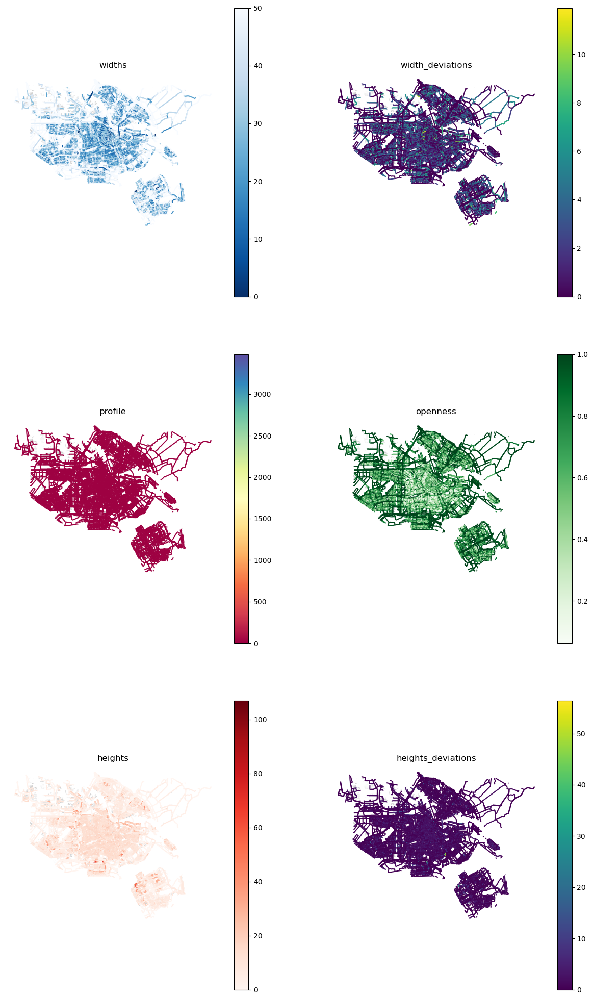

In [93]:
f, axes = plt.subplots(figsize=(15, 25), ncols=2, nrows=3)
edges_ams.plot(ax=axes[0][0], column='widths', legend=True, cmap='Blues_r')
bm_ams.plot(ax=axes[0][0], color='lightgrey')
edges_ams.plot(ax=axes[0][1], column='width_deviations', legend=True)
bm_ams.plot(ax=axes[0][1], color='lightgrey')
axes[0][0].set_axis_off()
axes[0][0].set_title('widths')
axes[0][1].set_axis_off()
axes[0][1].set_title('width_deviations')
edges_ams.plot(ax=axes[1][0], column='profile', legend=True, cmap='Spectral')
bm_ams.plot(ax=axes[1][0], color='lightgrey')
edges_ams.plot(ax=axes[1][1], column='openness', legend=True, cmap='Greens')
bm_ams.plot(ax=axes[1][1], color='lightgrey')
axes[1][0].set_axis_off()
axes[1][0].set_title('profile')
axes[1][1].set_axis_off()
axes[1][1].set_title('openness')
edges_ams.plot(ax=axes[2][0], column='heights', legend=True, cmap='Reds')
bm_ams.plot(ax=axes[2][0], color='lightgrey')
edges_ams.plot(ax=axes[2][1], column='heights_deviations', legend=True)
bm_ams.plot(ax=axes[2][1], color='lightgrey')
axes[2][0].set_axis_off()
axes[2][0].set_title('heights')
axes[2][1].set_axis_off()
axes[2][1].set_title('heights_deviations')
plt.savefig('../results/figures/ams_street_profile.png', dpi=300)
plt.show()

In [94]:
trees_other_ams = trees_other.clip(ams_shape)

__SHOW DANIELA__

In [ ]:
m = edges_ams.explore(column="widths", tooltip="widths", tiles="CartoDB positron", cmap="viridis"
)

trees_other_ams.explore(
     m=m, # use red color on all points
)

folium.TileLayer('CartoDB positron', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m  # show map

Using street width to grab trees in the streets

- select only streets in e-w
- buffer
- intersect with trees_other_ams

In [125]:
edges_ams_e_w_only = edges_ams.loc[(edges_ams.orientation_pure >= 80) & (edges_ams.orientation_pure <= 100)]

In [126]:
edges_ams_e_w_only['geometry'] = edges_ams_e_w_only.buffer((edges_ams_e_w_only['widths']/2), cap_style=2)

/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [104]:
edges_ams_e_w_only.head()

,,WVK_ID,WVK_BEGDAT,JTE_ID_BEG,JTE_ID_END,WEGBEHSRT,WEGNUMMER,WEGDEELLTR,HECTO_LTTR,BST_CODE,RPE_CODE,ADMRICHTNG,RIJRICHTNG,STT_NAAM,STT_BRON,WPSNAAM,GME_ID,GME_NAAM,HNRSTRLNKS,HNRSTRRHTS,E_HNR_LNKS,E_HNR_RHTS,L_HNR_LNKS,L_HNR_RHTS,BEGAFSTAND,ENDAFSTAND,BEGINKM,EINDKM,POS_TV_WOL,WEGBEHCODE,WEGBEHNAAM,DISTRCODE,DISTRNAAM,DIENSTCODE,DIENSTNAAM,WEGTYPE,WGTYPE_OMS,ROUTELTR,ROUTENR,ROUTELTR2,ROUTENR2,ROUTELTR3,ROUTENR3,ROUTELTR4,ROUTENR4,WEGNR_AW,WEGNR_HMP,GEOBRON_ID,GEOBRON_NM,BRONJAAR,OPENLR,BAG_ORL,FRC,FOW,ALT_NAAM,ALT_NR,REL_HOOGTE,geometry,orientation,orientation_pure,widths,width_deviations,openness,heights,heights_deviations,profile
135664,0,600610849,2022-03-01,600292680,600149513,G,None,#,#,FP,#,None,O,Anton Schleperspad,BAG schrijfwijze,Amsterdam,363,Amsterdam,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwNtuyU3bDfZA/68AB43CA==,0363300000002017,6,7,None,None,NaN,"POLYGON ((116239.553 483317.169, 116274.833 48...",9.084864,99.084864,50.00000,0.000000,1.0000,0.000000,0.000000,0.000000
135588,0,600925026,2022-03-01,600149863,600118880,G,None,#,#,FP,#,None,B,Koenenkade,BAG schrijfwijze,Amsterdam,363,Amsterdam,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,31,"Luchtfoto's, satellietbeelden",2019.0,CwNvlyU1zTfXDftu/7U3CA==,0363300000004022,6,7,None,None,NaN,"POLYGON ((117118.608 482189.771, 117042.489 48...",5.564061,84.435939,46.75698,2.221703,0.9625,3.850167,0.054297,0.082344
135619,0,600758386,2022-03-01,234366025,600149513,G,None,#,#,VP,#,None,B,Anton Schleperspad,BAG schrijfwijze,Amsterdam,363,Amsterdam,N,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,60,Huisnummerkaart (niet grafisch verantwoord),2004.0,CwNvXSU3lDfVDvs8/8g3CA==,0363300000002017,6,7,None,None,NaN,"POLYGON ((116921.267 483185.894, 116911.914 48...",3.858305,86.141695,50.00000,0.000000,1.0000,0.000000,0.000000,0.000000
135609,0,600925015,2022-03-01,600150393,232367028,G,None,#,#,None,Z,None,H,Oude Haagseweg,BAG schrijfwijze,Amsterdam,363,Amsterdam,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,31,"Luchtfoto's, satellietbeelden",2019.0,CwNtuCU3riqoAAATAAAqGA==,0363300000005503,5,2,None,None,NaN,"POLYGON ((116450.315 483440.983, 116451.039 48...",1.807090,91.807090,50.00000,0.000000,1.0000,0.000000,0.000000,0.000000
135620,0,600494642,2022-03-01,600292675,600292980,G,None,#,#,FP,#,None,O,Oude Haagseweg,BAG schrijfwijze,Amsterdam,363,Amsterdam,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,363,Amsterdam,0.0,None,None,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,12,Basisregistratie Topografie (BRT),2021.0,CwNtuCU3qjfIBwJbABs3FQ==,0363300000005503,6,7,None,None,NaN,"POLYGON ((116443.697 483431.642, 116531.739 48...",3.664380,86.335620,50.00000,0.000000,1.0000,0.000000,0.000000,0.000000


In [106]:
gdf = gpd.GeoDataFrame(
    edges_ams_e_w_only, geometry='geometry')

In [127]:
trees_ams_e_w_only = trees_other_ams.clip(edges_ams_e_w_only)

In [128]:
print(f'No of trees before exclusion: {trees_other_ams.shape} vs. after: {trees_ams_e_w_only.shape}')

No of trees before exclusion: (21271, 23) vs. after: (4805, 23)


In [ ]:
m = edges_ams.explore(column="orientation_pure", tooltip="widths", tiles="CartoDB positron", cmap="viridis"
)

trees_other_ams.explore(
    m=m,
    color="red"
)

trees_ams_e_w_only.explore(
     m=m, # pass the map object
     color="green", # use red color on all points
)

folium.TileLayer('CartoDB positron', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control
m.save("../results/output/trees_selection_e_w.html")

m  # show map

In [ ]:
trees_ams_e_w_only.explore()

In [ ]:
edges_ams.explore(column="profile", tooltip="profile", scheme='quantiles', tiles="CartoDB positron", cmap="viridis"
)

To-do: Clean up the street profile

<AxesSubplot: >

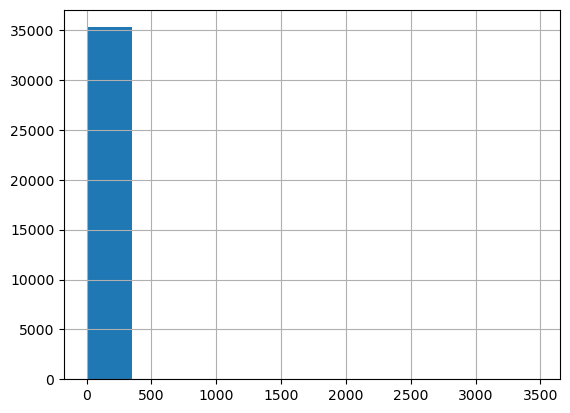

In [92]:
edges_ams.profile.hist()

In [56]:
edges_ams.profile.std()

31.48361085705929

In [43]:
edges_ams

,access,area,bicycle,bridge,busway,cycleway,est_width,foot,footway,highway,int_ref,junction,lanes,lit,maxspeed,motorcar,motorroad,motor_vehicle,name,oneway,overtaking,path,passing_places,psv,ref,service,segregated,sidewalk,smoothness,surface,tracktype,tunnel,turn,width,id,timestamp,version,tags,osm_type,u,v,length,geometry,orientation,orientation_pure,widths,width_deviations,openness,heights,heights_deviations,profile
251432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0
251926,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0
741822,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0
251431,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0
251430,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376989,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0
376990,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0
376993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0
376991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,50.0,0.0,1.0,0.0,0.0,0.0


In [44]:
edges_ams.profile.replace([np.inf, -np.inf], np.nan, inplace=True)
# Drop rows with NaN
edges_ams.profile.dropna(inplace=True)

In [35]:
from scipy.stats import norm

DECIDED TO GO WITH NATIONAL DATA INSTEAD: https://nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/60caa9e5-60c5-4072-a575-e11ef5a07mgl


Would have to simplify the network though. Might have to reach out to Martin for this? https://github.com/martinfleis/numerical-taxonomy-paper/blob/main/code_production/Amsterdam/200224_simplify_network.ipynb

In [57]:
mu, std = norm.fit(edges_ams['profile']) 

plt.hist(edges_ams['profile'],bins=15, density=True, alpha=0.6, color='g')

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)

plt.plot(x, p, 'k', linewidth=2)
title = "Fit results: mu {:.2f} and std {:.2f}".format(mu, std)
plt.title(title)

ValueError: The data contains non-finite values.

In [60]:
#Calculate the summary statistics on the temperature difference
data_mean, data_std = np.mean(edges_ams['profile']), np.std(edges_ams['profile'])

# Identify the outliers 
cut_off = data_std * 2
lower, upper = data_mean - cut_off, data_mean + cut_off


# Identify outliers

edges_ams_clean = edges_ams.loc[edges_ams['profile'].gt(lower) & edges_ams['profile'].lt(upper)]
                              
#[x for x in tempgdf_merged['Temp_difference'] if x > lower and x < upper]]
edges_ams_clean
# Remove outliers

,access,area,bicycle,bridge,busway,cycleway,est_width,foot,footway,highway,int_ref,junction,lanes,lit,maxspeed,motorcar,motorroad,motor_vehicle,name,oneway,overtaking,path,passing_places,psv,ref,service,segregated,sidewalk,smoothness,surface,tracktype,tunnel,turn,width,id,timestamp,version,tags,osm_type,u,v,length,geometry,orientation,orientation_pure,widths,width_deviations,openness,heights,heights_deviations,profile
251432,None,None,None,None,None,None,None,None,None,cycleway,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,34948468,0,-1,None,way,1222363492,71368358,8.613,"LINESTRING (133004.679 476925.168, 133006.613 ...",27.105340,117.105340,50.0,0.0,1.0,0.0,0.0,0.0
251926,None,None,None,None,None,None,None,None,None,unclassified,None,None,None,None,80,None,None,None,Googpad,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,35013060,0,-1,None,way,71368358,1222363354,8.487,"LINESTRING (133011.363 476919.865, 133013.876 ...",27.253444,27.253444,50.0,0.0,1.0,0.0,0.0,0.0
741822,None,None,None,None,None,None,None,None,None,track,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,grade4,None,None,None,747453660,0,-1,None,way,6993892373,6993892363,18.814,"LINESTRING (133092.317 476917.314, 133078.088 ...",27.853231,117.853231,50.0,0.0,1.0,0.0,0.0,0.0
251431,None,None,None,None,None,None,None,None,None,cycleway,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,34948468,0,-1,None,way,71368354,1222363492,8.512,"LINESTRING (132996.417 476927.319, 133004.679 ...",8.909499,98.909499,50.0,0.0,1.0,0.0,0.0,0.0
251430,None,None,None,None,None,None,None,None,None,cycleway,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,34948468,0,-1,None,way,1222363330,71368354,16.066,"LINESTRING (132980.366 476928.759, 132996.417 ...",2.992338,92.992338,50.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376989,None,None,None,None,None,None,None,None,None,service,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,driveway,None,None,None,None,None,None,None,None,170283685,0,-1,None,way,1814365267,1814365270,29.487,"LINESTRING (110974.717 493749.557, 110945.698 ...",6.553449,96.553449,50.0,0.0,1.0,0.0,0.0,0.0
376990,None,None,None,None,None,None,None,None,None,service,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,driveway,None,None,None,None,None,None,None,None,170283685,0,-1,None,way,1814365270,1814365274,17.919,"LINESTRING (110945.698 493755.280, 110927.994 ...",5.804146,95.804146,50.0,0.0,1.0,0.0,0.0,0.0
376993,None,None,None,None,None,None,None,None,None,service,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,driveway,None,None,None,None,None,None,None,None,170283685,0,-1,None,way,1814365276,1814365272,8.758,"LINESTRING (110902.883 493759.936, 110900.507 ...",10.300774,79.699226,50.0,0.0,1.0,0.0,0.0,0.0
376991,None,None,None,None,None,None,None,None,None,service,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,driveway,None,None,None,None,None,None,None,None,170283685,0,-1,None,way,1814365274,1814365278,13.179,"LINESTRING (110927.994 493758.387, 110914.853 ...",3.520999,93.520999,50.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
f, axes = plt.subplots(figsize=(30, 50), ncols=2, nrows=3)
edges_ams_clean.plot(ax=axes[0][0], column='widths', legend=True, cmap='Blues_r')
bm_ams.plot(ax=axes[0][0], color='lightgrey')
edges_ams_clean.plot(ax=axes[0][1], column='width_deviations', legend=True)
bm_ams.plot(ax=axes[0][1], color='lightgrey')
axes[0][0].set_axis_off()
axes[0][0].set_title('widths')
axes[0][1].set_axis_off()
axes[0][1].set_title('width_deviations')
edges_ams_clean.plot(ax=axes[1][0], column='profile', legend=True, cmap='Spectral')
bm_ams.plot(ax=axes[1][0], color='lightgrey')
edges_ams_clean.plot(ax=axes[1][1], column='openness', legend=True, cmap='Greens')
bm_ams.plot(ax=axes[1][1], color='lightgrey')
axes[1][0].set_axis_off()
axes[1][0].set_title('profile')
axes[1][1].set_axis_off()
axes[1][1].set_title('openness')
edges_ams_clean.plot(ax=axes[2][0], column='heights', legend=True, cmap='Reds')
bm_ams.plot(ax=axes[2][0], color='lightgrey')
edges_ams_clean.plot(ax=axes[2][1], column='heights_deviations', legend=True)
bm_ams.plot(ax=axes[2][1], color='lightgrey')
axes[2][0].set_axis_off()
axes[2][0].set_title('heights')
axes[2][1].set_axis_off()
axes[2][1].set_title('heights_deviations')
plt.savefig('../results/figures/ams_street_profile_clean.png', dpi=300)
plt.show()

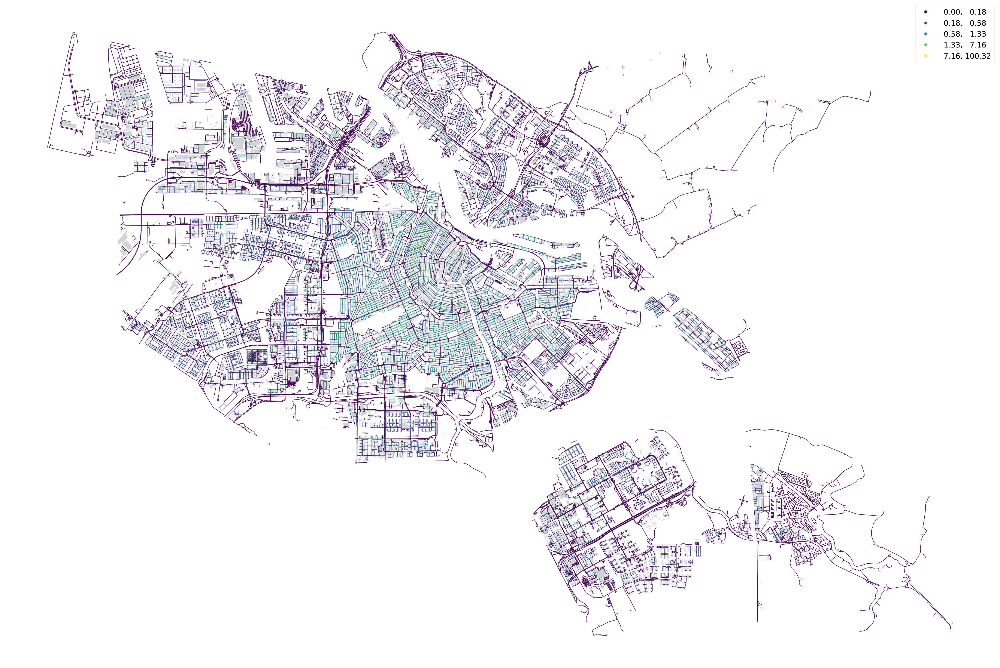

In [73]:
ax = edges_ams.plot(column='profile', figsize=(60,60), scheme='naturalbreaks', legend=True,  legend_kwds={'loc': 'best', 'fontsize': '25'})
bm_ams.plot(ax=ax, color='lightgrey')
ax.set_axis_off()
plt.savefig('../results/figures/ams_profile_just_driving.jpg', dpi=600)

In [74]:
edges_ams.to_file('../results/output/ams_street_profile.gpkg', driver='GPKG')

#### Use momepy to calculate street profile (orientation, w/h ratio)

Running with gds8 - but not with my own environment.

In [1]:
import momepy
import geopandas as gpd
import matplotlib.pyplot as plt

#import os; os.environ['PROJ_LIB'] = '/path/to/env/share/proj'  #- prob not necessary if in own environment, just for gds8 error

/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/momepy/coins.py:15: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [13]:
import osmnx as ox

In [18]:
# Select a example tree to test out the code
one_tree = ams_trees.sample()
one_tree = one_tree.to_crs(4326)
one_tree = one_tree.geometry
one_tree

NameError: name 'ams_trees' is not defined

In [19]:
one_tree = (52.34682, 4.84981)

In [20]:
# distance from tree for the osm query.
dist = 500

In [15]:
gdf = ox.geometries.geometries_from_point(one_tree, dist=dist, tags={'building':True})
buildings = ox.projection.project_gdf(gdf)
buildings = buildings[buildings.geom_type.isin(['Polygon', 'MultiPolygon'])]

In [16]:
# Heights converted to floats, buildings exploded to avoid multipolygons
# In the case of Amsterdam, osm buildings don't have height information so this is only partially working.

def clean_heights(x):
    try:
        return float(x)
    except ValueError:
        return 0

buildings['height'] = buildings['height'].fillna(0).apply(clean_heights)
buildings = buildings.reset_index().explode()
buildings.reset_index(inplace=True, drop=True)

/tmp/ipykernel_157/1809077929.py:8: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  buildings = buildings.reset_index().explode()


In [17]:
# Query the street network, will likely have to change the network type for the Netherlands

streets_graph = ox.graph_from_point(one_tree, dist, network_type='drive')
streets_graph = ox.projection.project_graph(streets_graph)
edges = ox.graph_to_gdfs(streets_graph, nodes=False, edges=True,
                                   node_geometry=False, fill_edge_geometry=True)

/opt/conda/lib/python3.9/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/opt/conda/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/conda/lib/python3.9/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/opt/conda/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


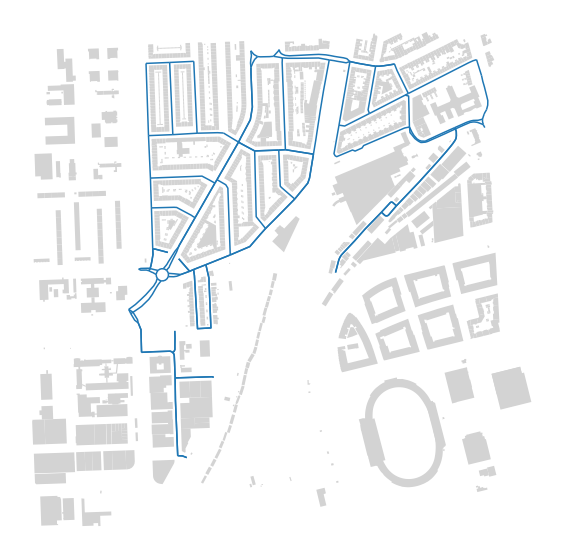

In [18]:
ax = buildings.plot(figsize=(10, 10), color='lightgrey')
edges.plot(ax=ax)
ax.set_axis_off()

In [19]:
profile = momepy.StreetProfile(edges, buildings, heights='height')

/opt/conda/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/conda/lib/python3.9/site-packages/momepy/dimension.py:640: RuntimeWarning: invalid value encountered in long_scalars
  openness.append(np.isnan(s).sum() / (f).sum())


In [20]:
edges['widths'] = profile.w
edges['width_deviations'] = profile.wd
edges['openness'] = profile.o
edges['heights'] = profile.h
edges['heights_deviations'] = profile.hd
edges['profile'] = profile.p

/opt/conda/lib/python3.9/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/opt/conda/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/conda/lib/python3.9/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/opt/conda/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/conda/lib/python3.9/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are depreca

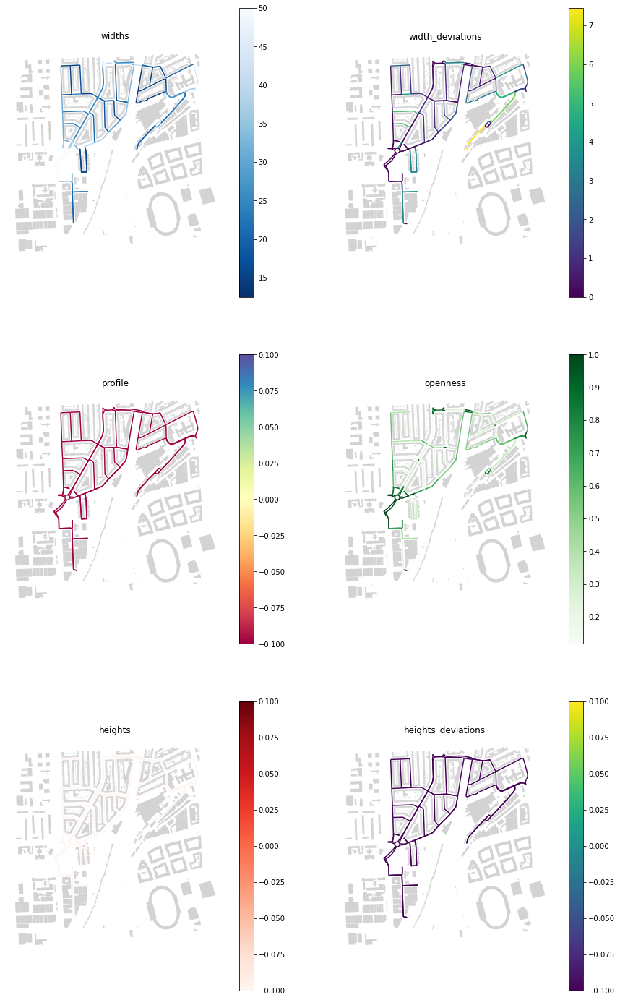

In [21]:
f, axes = plt.subplots(figsize=(15, 25), ncols=2, nrows=3)
edges.plot(ax=axes[0][0], column='widths', legend=True, cmap='Blues_r')
buildings.plot(ax=axes[0][0], color='lightgrey')
edges.plot(ax=axes[0][1], column='width_deviations', legend=True)
buildings.plot(ax=axes[0][1], color='lightgrey')
axes[0][0].set_axis_off()
axes[0][0].set_title('widths')
axes[0][1].set_axis_off()
axes[0][1].set_title('width_deviations')
edges.plot(ax=axes[1][0], column='profile', legend=True, cmap='Spectral')
buildings.plot(ax=axes[1][0], color='lightgrey')
edges.plot(ax=axes[1][1], column='openness', legend=True, cmap='Greens')
buildings.plot(ax=axes[1][1], color='lightgrey')
axes[1][0].set_axis_off()
axes[1][0].set_title('profile')
axes[1][1].set_axis_off()
axes[1][1].set_title('openness')
edges.plot(ax=axes[2][0], column='heights', legend=True, cmap='Reds')
buildings.plot(ax=axes[2][0], color='lightgrey')
edges.plot(ax=axes[2][1], column='heights_deviations', legend=True)
buildings.plot(ax=axes[2][1], color='lightgrey')
axes[2][0].set_axis_off()
axes[2][0].set_title('heights')
axes[2][1].set_axis_off()
axes[2][1].set_title('heights_deviations')
plt.show()

In [24]:
edges.columns

Index(['osmid', 'name', 'highway', 'maxspeed', 'oneway', 'length', 'geometry',
       'lanes', 'ref', 'junction', 'access', 'bridge', 'widths',
       'width_deviations', 'openness', 'heights', 'heights_deviations',
       'profile'],
      dtype='object')

### OLD, just for referenec
For the tree selection we only want to consider roads that are E-W. Momepy includes a function that calculates the deviation from cardinal directions in degrees. After some adaptation we get to a point where we can easily calculate the azimuth of linestrings.

In [ ]:
edges = gpd.read_file('../data/raw_data/osm/amsterdam_all_network.gpkg')

<AxesSubplot:>

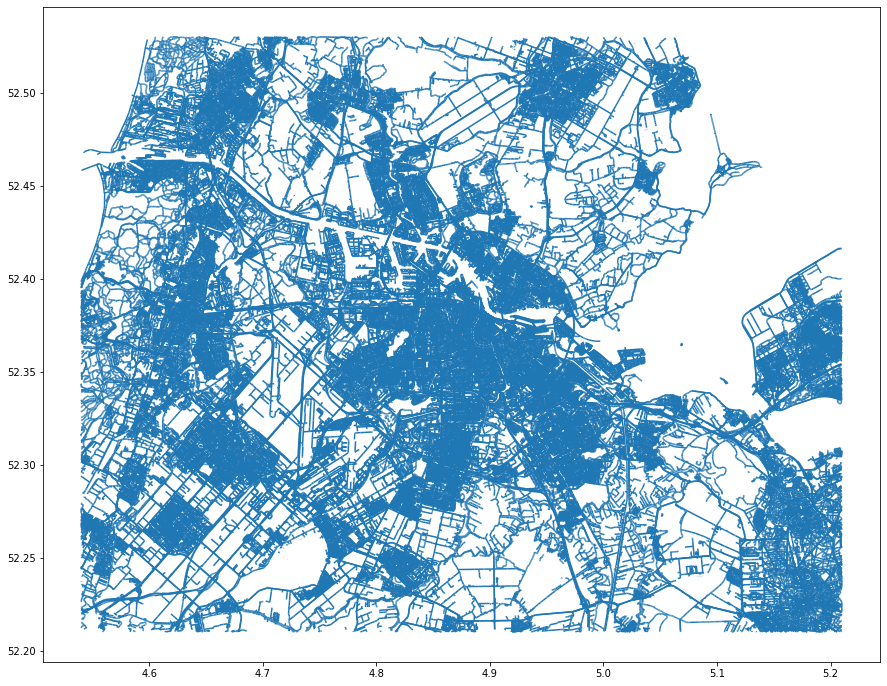

In [4]:
edges.plot(figsize=(15,15))

In [ ]:
edges.explore()

In [4]:
# Momepy integrated method to calculate street orientation (deviation from cardinal directions). Exemplary.

edges['orientation'] = momepy.Orientation(edges).series
edges

  0%|          | 0/963022 [00:00<?, ?it/s]

/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/momepy/distribution.py:74: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom.type in ["Polygon", "MultiPolygon", "LinearRing"]:
/opt/anaconda3/envs/momepy_env_2/lib/python3.11/site-packages/momepy/distribution.py:84: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  elif geom.type in ["LineString", "MultiLineString"]:


,access,area,bicycle,bridge,busway,cycleway,est_width,foot,footway,highway,int_ref,junction,lanes,lit,maxspeed,motorcar,motorroad,motor_vehicle,name,oneway,overtaking,path,passing_places,psv,ref,service,segregated,sidewalk,smoothness,surface,tracktype,tunnel,turn,width,id,timestamp,version,tags,osm_type,u,v,length,geometry,orientation
0,None,None,None,None,None,None,None,None,None,cycleway,None,None,None,yes,None,None,None,None,None,None,None,None,None,None,None,None,None,None,good,asphalt,None,None,None,None,4264947,0,-1,"{""mofa"":""no"",""moped"":""no"",""traffic_sign"":""NL:G...",way,288267212,3310565326,1.230,"LINESTRING (4.92236 52.36544, 4.92237 52.36543)",37.030390
1,None,None,None,None,None,None,None,None,None,cycleway,None,None,None,yes,None,None,None,None,None,None,None,None,None,None,None,None,None,None,good,asphalt,None,None,None,None,4264947,0,-1,"{""mofa"":""no"",""moped"":""no"",""traffic_sign"":""NL:G...",way,3310565326,3310565325,1.743,"LINESTRING (4.92237 52.36543, 4.92239 52.36542)",30.141386
2,None,yes,None,None,None,None,None,None,None,pedestrian,None,None,None,None,None,None,None,None,Dapperplein,None,None,None,None,None,None,None,None,None,None,asphalt,None,None,None,None,4270144,0,-1,None,way,25645930,25645951,7.683,"LINESTRING (4.92794 52.36198, 4.92802 52.36203)",26.853759
3,None,yes,None,None,None,None,None,None,None,pedestrian,None,None,None,None,None,None,None,None,Dapperplein,None,None,None,None,None,None,None,None,None,None,asphalt,None,None,None,None,4270144,0,-1,None,way,25645951,764717676,10.427,"LINESTRING (4.92802 52.36203, 4.92805 52.36212)",19.292829
4,None,yes,None,None,None,None,None,None,None,pedestrian,None,None,None,None,None,None,None,None,Dapperplein,None,None,None,None,None,None,None,None,None,None,asphalt,None,None,None,None,4270144,0,-1,None,way,764717676,25645952,11.668,"LINESTRING (4.92805 52.36212, 4.92804 52.36222)",7.407989
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963017,None,None,None,None,None,None,None,None,None,footway,None,None,1,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,1,1128318412,0,-1,None,way,10315595692,5421106038,5.974,"LINESTRING (4.90127 52.41935, 4.90136 52.41934)",2.345274
963018,None,None,None,None,None,None,None,None,None,footway,None,None,1,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,2,1128318413,0,-1,None,way,5421106037,5421106055,4.725,"LINESTRING (4.90040 52.41935, 4.90041 52.41931)",6.191834
963019,None,None,None,None,None,None,None,None,None,footway,None,None,1,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,2,1128318413,0,-1,None,way,5421106055,10315595800,6.719,"LINESTRING (4.90041 52.41931, 4.90041 52.41925)",6.058463
963020,None,None,None,None,None,None,None,None,None,footway,None,None,1,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,1,1128318414,0,-1,None,way,10315595807,10315595806,6.485,"LINESTRING (4.89987 52.41933, 4.89988 52.41927)",6.080741


__NEXT STEP: BUILD FUNCTION TO DOWNLOAD OSM STREETS FOR ALL STUDY AREAS. CALCULATE STREET ORIENTATION AND H/WIDTH FOR EACH. EXCLUDE STREETS THAT ARE NOT E-W (with some grace), DEFINE BUFFER, PERFORM INTERSECT WITH TREE DATASET__

### Task No 2: Adapting the street profile function to take 3dbm buildings data as input.

- take 3dbm dataset
- find out how the osm point extract extracts buildings (not a clip?
- do that with 3dbm
- calculate street profile

#### What I thought I needed to do:

In [14]:
from shapely.geometry import Polygon

In [15]:
# Adapted from Boeing, osmnx. 

#First, get functions to get the BBox

def bbox_from_point(point, dist=1000):#, project_utm=False, return_crs=False):
    """
    Create a bounding box from a (lat, lng) center point.
    Create a bounding box some distance in each direction (north, south, east,
    and west) from the center point and optionally project it.
    Parameters
    ----------
    point : tuple
        the (lat, lng) center point to create the bounding box around
    dist : int
        bounding box distance in meters from the center point
    project_utm : bool
        if True, return bounding box as UTM-projected coordinates
    return_crs : bool
        if True, and project_utm=True, return the projected CRS too
    Returns
    -------
    tuple
        (north, south, east, west) or (north, south, east, west, crs_proj)
    """
    earth_radius = 6_371_009  # meters
    lat, lng = point

    delta_lat = (dist / earth_radius) * (180 / np.pi)
    delta_lng = (dist / earth_radius) * (180 / np.pi) / np.cos(lat * np.pi / 180)
    north = lat + delta_lat
    south = lat - delta_lat
    east = lng + delta_lng
    west = lng - delta_lng
    
    return north, south, east, west

#     if project_utm:
#         bbox_poly = bbox_to_poly(north, south, east, west)
#         bbox_proj, crs_proj = projection.project_geometry(bbox_poly)
#         west, south, east, north = bbox_proj.bounds

#     utils.log(f"Created bbox {dist} m from {point}: {north},{south},{east},{west}")

#     if project_utm and return_crs:
#         return north, south, east, west, crs_proj
#     else:
#         return north, south, east, west

def bbox_to_poly(north, south, east, west):
    """
    Convert bounding box coordinates to shapely Polygon.
    Parameters
    ----------
    north : float
        northern coordinate
    south : float
        southern coordinate
    east : float
        eastern coordinate
    west : float
        western coordinate
    Returns
    -------
    shapely.geometry.Polygon
    """
    return Polygon([(west, south), (east, south), (east, north), (west, north)])

In [16]:
# This is how geometries would be downloaded from OSM.
def geometries_from_polygon(polygon, tags):
    """
    Create GeoDataFrame of OSM entities within boundaries of a (multi)polygon.
    Parameters
    ----------
    polygon : shapely.geometry.Polygon or shapely.geometry.MultiPolygon
        geographic boundaries to fetch geometries within
    tags : dict
        Dict of tags used for finding objects in the selected area. Results
        returned are the union, not intersection of each individual tag.
        Each result matches at least one given tag. The dict keys should be
        OSM tags, (e.g., `building`, `landuse`, `highway`, etc) and the dict
        values should be either `True` to retrieve all items with the given
        tag, or a string to get a single tag-value combination, or a list of
        strings to get multiple values for the given tag. For example,
        `tags = {'building': True}` would return all building footprints in
        the area. `tags = {'amenity':True, 'landuse':['retail','commercial'],
        'highway':'bus_stop'}` would return all amenities, landuse=retail,
        landuse=commercial, and highway=bus_stop.
    Returns
    -------
    gdf : geopandas.GeoDataFrame
    Notes
    -----
    You can configure the Overpass server timeout, memory allocation, and
    other custom settings via the `settings` module.
    """
    # verify that the geometry is valid and a Polygon/MultiPolygon
    if not polygon.is_valid:
        raise ValueError("The geometry of `polygon` is invalid")
    if not isinstance(polygon, (Polygon, MultiPolygon)):
        raise TypeError(
            "Boundaries must be a shapely Polygon or MultiPolygon. If you requested "
            "geometries from place name, make sure your query resolves to a Polygon or "
            "MultiPolygon, and not some other geometry, like a Point. See OSMnx "
            "documentation for details."
        )

    # download the geometry data from OSM
    response_jsons = downloader._osm_geometries_download(polygon, tags)

    # create GeoDataFrame from the downloaded data
    gdf = _create_gdf(response_jsons, polygon, tags)

    return gdf

In [40]:
# Change into geometries from tree point using 3dbm
def geometries_from_point(center_point, dbm_gdf, dist=1000):
    """
    Create GeoDataFrame of OSM entities within some distance N, S, E, W of a point.
    Parameters
    ----------
    center_point : tuple
        the (lat, lng) center point around which to get the geometries
    tags : dict
        Dict of tags used for finding objects in the selected area. Results
        returned are the union, not intersection of each individual tag.
        Each result matches at least one given tag. The dict keys should be
        OSM tags, (e.g., `building`, `landuse`, `highway`, etc) and the dict
        values should be either `True` to retrieve all items with the given
        tag, or a string to get a single tag-value combination, or a list of
        strings to get multiple values for the given tag. For example,
        `tags = {'building': True}` would return all building footprints in
        the area. `tags = {'amenity':True, 'landuse':['retail','commercial'],
        'highway':'bus_stop'}` would return all amenities, landuse=retail,
        landuse=commercial, and highway=bus_stop.
    dist : numeric
        distance in meters
    Returns
    -------
    gdf : geopandas.GeoDataFrame
    Notes
    -----
    You can configure the Overpass server timeout, memory allocation, and
    other custom settings via the `settings` module.
    """
    # create bounding box from center point and distance in each direction
    north, south, east, west = bbox_from_point(center_point, dist)
    
    #df_sac.cx[north:south, east:west]

    # convert the bounding box to a polygon
    polygon = bbox_to_poly(north, south, east, west)
    
    ## Addition
    polygon = polygon.buffer(0)
    
    gdf = dbm_gdf.cx[north:south, east:west]
    #gdf = dbm_gdf['geometry'].intersection(polygon)

    # create GeoDataFrame of geometries within this polygon, from 3dbm
    #gdf = geometries_from_polygon(polygon, tags)
    

    return gdf


https://geopandas.org/en/stable/docs/user_guide/set_operations.html#the-different-overlay-operations

https://geopandas.org/en/stable/docs/user_guide/geometric_manipulations.html

In [38]:
dbm = gpd.read_file('../data/raw_data/3dbm/lod22_ams_only_indicators.gpkg').to_crs(4326)
dbm.head()

,id,average_building_height_50m,tree_crown_area_25m,gsi_25m,FSI_50m,grass_coverage_area_50m,building_height,ground_area,B_Stov,geometry
0,NL.IMBAG.Pand.0363100012164990-0,11.780027,0.000000,0.077371,1.874703,0.0,12.6135,87.878157,0.383704,"POLYGON ((4.88571 52.37238, 4.88571 52.37238, ..."
1,NL.IMBAG.Pand.0363100012164992-0,12.190426,320.254426,0.272244,1.516967,0.0,17.7980,1284.896917,0.215029,"POLYGON ((4.88639 52.37295, 4.88641 52.37295, ..."
2,NL.IMBAG.Pand.0363100012164992-1,11.296865,0.000000,0.042628,2.283645,0.0,3.2050,77.050902,1.250809,"POLYGON ((4.88612 52.37278, 4.88613 52.37281, ..."
3,NL.IMBAG.Pand.0363100012164992-2,11.615405,0.000000,0.028059,2.448055,0.0,3.2105,52.980354,0.944105,"POLYGON ((4.88607 52.37293, 4.88606 52.37281, ..."
4,NL.IMBAG.Pand.0363100012164993-0,11.923413,229.080790,0.194887,1.387024,0.0,14.7345,814.753183,0.366393,"POLYGON ((4.88676 52.37299, 4.88676 52.37299, ..."


In [41]:
dbm_buildings = geometries_from_point(center_point=one_tree, dbm_gdf=dbm, dist=dist)

https://gis.stackexchange.com/questions/266730/filter-by-bounding-box-in-geopandas

In [42]:
dbm_buildings

,id,average_building_height_50m,tree_crown_area_25m,gsi_25m,FSI_50m,grass_coverage_area_50m,building_height,ground_area,B_Stov,geometry


#### What I actually needed to do:

#### Momepy example calculation

Running with gds8 - but not with my own environment.

In [3]:
point = (40.731603, -73.977857)
dist = 1000
gdf = ox.geometries.geometries_from_point(point, dist=dist, tags={'building':True})
buildings = ox.projection.project_gdf(gdf)
buildings = buildings[buildings.geom_type.isin(['Polygon', 'MultiPolygon'])]

/opt/conda/lib/python3.9/site-packages/osmnx/geometries.py:805: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for merged_outer_linestring in list(merged_outer_linestrings):
/opt/conda/lib/python3.9/site-packages/osmnx/geometries.py:805: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for merged_outer_linestring in list(merged_outer_linestrings):


In [4]:

def clean_heights(x):
    try:
        return float(x)
    except ValueError:
        return 0

buildings['height'] = buildings['height'].fillna(0).apply(clean_heights)
buildings = buildings.reset_index().explode()
buildings.reset_index(inplace=True, drop=True)

/tmp/ipykernel_157/157608058.py:8: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  buildings = buildings.reset_index().explode()


In [5]:
streets_graph = ox.graph_from_point(point, dist, network_type='drive')
streets_graph = ox.projection.project_graph(streets_graph)
edges = ox.graph_to_gdfs(streets_graph, nodes=False, edges=True,
                                   node_geometry=False, fill_edge_geometry=True)

/opt/conda/lib/python3.9/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/opt/conda/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/conda/lib/python3.9/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/opt/conda/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


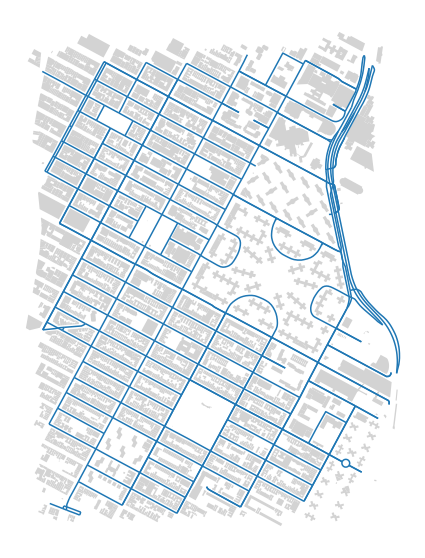

In [6]:
ax = buildings.plot(figsize=(10, 10), color='lightgrey')
edges.plot(ax=ax)
ax.set_axis_off()

In [9]:
profile = momepy.StreetProfile(edges, buildings, heights='height')

/opt/conda/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [10]:
edges['widths'] = profile.w
edges['width_deviations'] = profile.wd
edges['openness'] = profile.o
edges['heights'] = profile.h
edges['heights_deviations'] = profile.hd
edges['profile'] = profile.p

In [ ]:
f, axes = plt.subplots(figsize=(15, 25), ncols=2, nrows=3)
edges.plot(ax=axes[0][0], column='widths', legend=True, cmap='Blues_r')
buildings.plot(ax=axes[0][0], color='lightgrey')
edges.plot(ax=axes[0][1], column='width_deviations', legend=True)
buildings.plot(ax=axes[0][1], color='lightgrey')
axes[0][0].set_axis_off()
axes[0][0].set_title('widths')
axes[0][1].set_axis_off()
axes[0][1].set_title('width_deviations')
edges.plot(ax=axes[1][0], column='profile', legend=True, cmap='Spectral')
buildings.plot(ax=axes[1][0], color='lightgrey')
edges.plot(ax=axes[1][1], column='openness', legend=True, cmap='Greens')
buildings.plot(ax=axes[1][1], color='lightgrey')
axes[1][0].set_axis_off()
axes[1][0].set_title('profile')
axes[1][1].set_axis_off()
axes[1][1].set_title('openness')
edges.plot(ax=axes[2][0], column='heights', legend=True, cmap='Reds')
buildings.plot(ax=axes[2][0], color='lightgrey')
edges.plot(ax=axes[2][1], column='heights_deviations', legend=True)
buildings.plot(ax=axes[2][1], color='lightgrey')
axes[2][0].set_axis_off()
axes[2][0].set_title('heights')
axes[2][1].set_axis_off()
axes[2][1].set_title('heights_deviations')
plt.show()

In [12]:
edges

osmid                 name  \
u          v          key                                                
42421828   42430942   0                 194923763     East 10th Street   
           42430938   0                 194923763     East 10th Street   
42430942   42449038   0                  25167210             Avenue D   
           274342024  0                 194923762     East 10th Street   
           42421828   0                 194923763     East 10th Street   
...                                           ...                  ...   
4597668040 4597668039 0                 464683329    Park Avenue South   
7480301865 7480301864 0                 195743130         Allen Street   
6331080434 42451018   0                 676028733    Peter Cooper Road   
7480301866 5798966629 0                 818252752           1st Avenue   
           1919595914 0    [993797891, 993797883]  East Houston Street   

                               highway maxspeed  oneway   length  \
u          v          key                                          
42421828   42430942   0       tertiary   20 mph   False  101.449   
           42430938   0       tertiary   20 mph   False  127.633   
42430942   42449038   0       tertiary   20 mph   False   75.500   
           274342024  0    residential   20 mph   False   63.777   
           42421828   0       tertiary   20 mph   False  101.449   
...                                ...      ...     ...      ...   
4597668040 4597668039 0      secondary   25 mph    True   79.106   
7480301865 7480301864 0        primary   25 mph    True   12.763   
6331080434 42451018   0    residential   25 mph    True   13.441   
7480301866 5798966629 0        primary   25 mph    True   13.686   
           1919595914 0        primary   25 mph    True   61.137   

                                                                    geometry  \
u          v          key                                                      
42421828   42430942   0    LINESTRING (586459.281 4508770.370, 586539.672...   
           42430938   0    LINESTRING (586459.281 4508770.370, 586361.103...   
42430942   42449038   0    LINESTRING (586548.368 4508721.561, 586544.259...   
           274342024  0    LINESTRING (586548.368 4508721.561, 586556.902...   
           42421828   0    LINESTRING (586548.368 4508721.561, 586539.672...   
...                                                                      ...   
4597668040 4597668039 0    LINESTRING (585538.318 4510337.830, 585535.151...   
7480301865 7480301864 0    LINESTRING (585406.606 4508500.813, 585401.377...   
6331080434 42451018   0    LINESTRING (586547.311 4509755.619, 586555.193...   
7480301866 5798966629 0    LINESTRING (585416.922 4508482.991, 585418.091...   
           1919595914 0    LINESTRING (585416.922 4508482.991, 585427.562...   

                          lanes  ref bridge junction access     widths  \
u          v          key                                                
42421828   42430942   0     NaN  NaN    NaN      NaN    NaN  22.933577   
           42430938   0     NaN  NaN    NaN      NaN    NaN  25.404220   
42430942   42449038   0       2  NaN    NaN      NaN    NaN  30.684773   
           274342024  0     NaN  NaN    NaN      NaN    NaN  30.700237   
           42421828   0     NaN  NaN    NaN      NaN    NaN  22.933577   
...                         ...  ...    ...      ...    ...        ...   
4597668040 4597668039 0       2  NaN    NaN      NaN    NaN  31.449134   
7480301865 7480301864 0     NaN  NaN    NaN      NaN    NaN  50.000000   
6331080434 42451018   0     NaN  NaN    NaN      NaN    NaN  50.000000   
7480301866 5798966629 0       2  NaN    NaN      NaN    NaN  50.000000   
           1919595914 0       2  NaN    NaN      NaN    NaN  37.239310   

                           width_deviations  openness    heights  \
u          v          key                                          
42421828   42430942   0            0.798752  0.450000  1